## If environmental areas area high resource areas, then their protection will necessitate more wind and more land usage elsewhere to meet decarbonization goals

In [1]:
import os
import glob

import yaml
import rasterio
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.plot import show

## File Paths

In [2]:
# set year of analysis
year = 2050

# data dir
data_dir = os.path.join(os.path.dirname(os.getcwd()), 'data', 'input_data')

# output data dir
output_dir = os.path.join(os.path.dirname(os.getcwd()), 'data', 'output_data')

# raster dir
raster_dir = os.path.join(data_dir, 'raster_data')

# state raster path
state_raster_path = os.path.join(raster_dir, 'state_raster', 'state_raster_land.tif')


# west raster data dir
west_raster_dir = os.path.join(data_dir, 'west_raster_data')

# rasters with land area extent
land_area_raster_dir = os.path.join(west_raster_dir, 'land_area')

# dac exclusion raster path
dac_raster_path = os.path.join(land_area_raster_dir, 'gridcerf_usceq_cejst_exclude_all_dacs.tif')

# farmland exclusion raster path
farm_raster_path = os.path.join(land_area_raster_dir, 'gridcerf_usda_combined_important_farmland.tif')

env_1_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_1.tif')
env_1_1km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_1_1buff.tif')
env_1_5km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_1_5buff.tif')
env_1_10km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_1_10buff.tif')

env_2_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_2.tif')
env_2_1km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_2_1buff.tif')
env_2_5km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_2_5buff.tif')
env_2_10km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_2_10buff.tif')
                          
env_3_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_3.tif')
env_3_1km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_3_1buff.tif')
env_3_5km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_3_5buff.tif')
env_3_10km_path = os.path.join(land_area_raster_dir, 'gridcerf_combined_environment_level_3_10buff.tif')
                          

# wind potential layer
wind_potential_path = os.path.join(land_area_raster_dir,'wind_100m_hubheight_2050_rcp85_potential_base_exclusions.tif')

# wind potential layer
solar_potential_path = os.path.join(land_area_raster_dir,'gridcerf_solar_pv_resource_potential.tif')






# env raster path
env_1km_raster_path = os.path.join(raster_dir, 'environmental', 'all_areas', 'west_analysis_combined_environment_1buff.tif')
env_5km_raster_path = os.path.join(raster_dir, 'environmental',  'all_areas','west_analysis_combined_environment_5buff.tif')
env_10km_raster_path = os.path.join(raster_dir, 'environmental',  'all_areas', 'west_analysis_combined_environment_10buff.tif')

# infrastructure siting output csv
infrastucture_path = os.path.join(data_dir,  'infrastructure_data_csv', f'infrastructure_data_{year}.csv')

# wind no potential layer
wind_no_potential_path = os.path.join(raster_dir, 'suitability', 'wind_no_potential', 'all_areas', 'gridcerf_wind_onshore_no_potential_100m.tif')

GCAM DATA download: https://zenodo.org/records/8377779

## Settings

In [3]:
exclusion_combos = {'baseline': [],
                    'dac': [dac_raster_path], 
                    'farmland': [farm_raster_path],
                    'env_1': [env_1_path],
                    'env_1_1km': [env_1_1km_path],
                    'env_1_5km': [env_1_5km_path],
                    'env_1_10km': [env_1_10km_path],

                    'env_2':  [env_2_path],
                    'env_2_1km': [env_2_1km_path],
                    'env_2_5km': [env_2_5km_path],
                    'env_2_10km': [env_2_10km_path],
                    
                    'env_3': [env_3_path],
                    'env_3_1km': [env_3_1km_path],
                    'env_3_5km': [env_3_5km_path],
                    'env_3_10km': [env_3_10km_path],

                    # combinations
                    'dac_farm_env1': [dac_raster_path, farm_raster_path, env_1_path], 
                    'dac_farm_env2':[dac_raster_path, farm_raster_path, env_2_path], 
                    'dac_farm_env3':[dac_raster_path, farm_raster_path, env_3_path],
                   
                    'dac_farm_env1_1km': [dac_raster_path, farm_raster_path, env_1_1km_path], 
                    'dac_farm_env2_1km':[dac_raster_path, farm_raster_path, env_2_1km_path], 
                    'dac_farm_env3_1km':[dac_raster_path, farm_raster_path, env_3_1km_path],
                   
                    'dac_farm_env1_5km': [dac_raster_path, farm_raster_path, env_1_5km_path], 
                    'dac_farm_env2_5km':[dac_raster_path, farm_raster_path, env_2_5km_path], 
                    'dac_farm_env3_5km':[dac_raster_path, farm_raster_path, env_3_5km_path]
                   }


state_settings_dict={
    'arizona': {'id_no': 4},
    'california': {'id_no': 6},
    'colorado':{'id_no': 8},
    'idaho':{'id_no': 16},
    'montana':{'id_no': 30},
    'new_mexico':{'id_no': 35},
    'nevada':{'id_no': 32},
    'oregon':{'id_no':41},
    'utah':{'id_no': 49},
    'washington':{'id_no': 53},
    'wyoming':{'id_no': 56}}


# prepare output dictionary to store analysis values
output_dict={
    'arizona': {},
    'california': {},
    'colorado':{},
    'idaho':{},
    'montana':{},
    'new_mexico':{},
    'nevada':{},
    'oregon':{},
    'utah':{},
    'washington':{},
    'wyoming':{}
}
for state in output_dict:
    output_dict[state].update({'Wind':{}, 'Solar PV': {}})
    
    for i in output_dict[state]:
        for j in exclusion_combos:
            output_dict[state][i].update({j:{'total_gen':[], 'total_km':[]}})


hours_per_year = 8760

output_dict

{'arizona': {'Wind': {'baseline': {'total_gen': [], 'total_km': []},
   'dac': {'total_gen': [], 'total_km': []},
   'farmland': {'total_gen': [], 'total_km': []},
   'env_1': {'total_gen': [], 'total_km': []},
   'env_1_1km': {'total_gen': [], 'total_km': []},
   'env_1_5km': {'total_gen': [], 'total_km': []},
   'env_1_10km': {'total_gen': [], 'total_km': []},
   'env_2': {'total_gen': [], 'total_km': []},
   'env_2_1km': {'total_gen': [], 'total_km': []},
   'env_2_5km': {'total_gen': [], 'total_km': []},
   'env_2_10km': {'total_gen': [], 'total_km': []},
   'env_3': {'total_gen': [], 'total_km': []},
   'env_3_1km': {'total_gen': [], 'total_km': []},
   'env_3_5km': {'total_gen': [], 'total_km': []},
   'env_3_10km': {'total_gen': [], 'total_km': []},
   'dac_farm_env1': {'total_gen': [], 'total_km': []},
   'dac_farm_env2': {'total_gen': [], 'total_km': []},
   'dac_farm_env3': {'total_gen': [], 'total_km': []},
   'dac_farm_env1_1km': {'total_gen': [], 'total_km': []},
   'dac_f

## Read in State Raster Data

In [4]:
# open state raster file
conus_array = rasterio.open(state_raster_path).read(1)

## Wind Analysis

### Calculate Wind Generation Availability by Scenario 

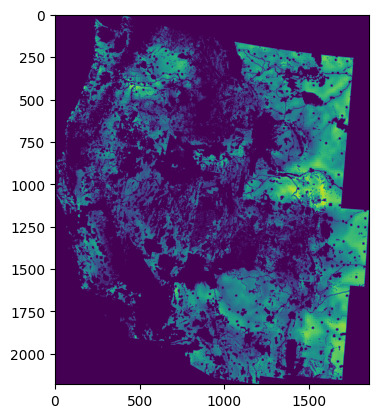

baseline
[]


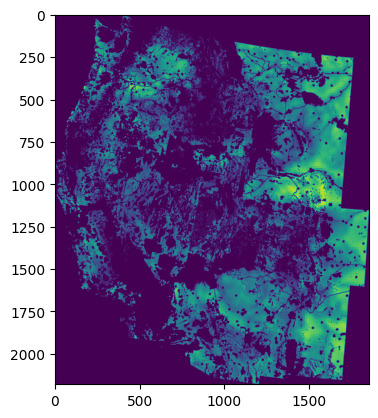

arizona total_generation: 2117137331 needed_generation: 27293103 difference: 2089844228.1914062 total land: 7185
california total_generation: 1061424139 needed_generation: 154566960 difference: 906857179.6876526 total land: 54413
colorado total_generation: 2134073511 needed_generation: 69555893 difference: 2064517618.3357544 total land: 16280
idaho total_generation: 600901758 needed_generation: 12397083 difference: 588504675.4181213 total land: 3398
montana total_generation: 3239887943 needed_generation: 128392581 difference: 3111495362.420105 total land: 31189
new_mexico total_generation: 3352250387 needed_generation: 46859963 difference: 3305390424.0251465 total land: 10166
nevada total_generation: 949583183 needed_generation: 9602251 difference: 939980932.2827759 total land: 3185
oregon total_generation: 1317790777 needed_generation: 33197367 difference: 1284593410.4905396 total land: 7988
utah total_generation: 445117816 needed_generation: 32291576 difference: 412826240.9869995 tot

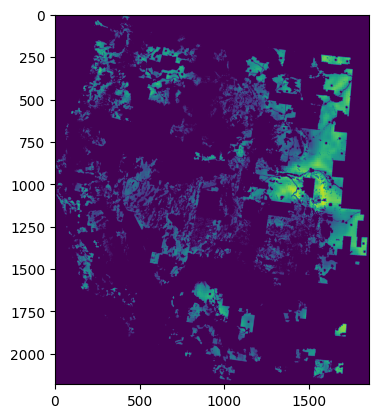

arizona total_generation: 615777559 needed_generation: 27293103 difference: 588484456.9505615 total land: 7660
california total_generation: 453507826 needed_generation: 154566960 difference: 298940866.9036865 total land: 38845
colorado total_generation: 1079070389 needed_generation: 69555893 difference: 1009514496.43573 total land: 17469
idaho total_generation: 257018155 needed_generation: 12397083 difference: 244621072.30517578 total land: 3514
montana total_generation: 1597096864 needed_generation: 128392581 difference: 1468704283.4839478 total land: 32676
new_mexico total_generation: 325880282 needed_generation: 46859963 difference: 279020319.8765869 total land: 13060
nevada total_generation: 694283703 needed_generation: 9602251 difference: 684681452.8531494 total land: 3424
oregon total_generation: 446620943 needed_generation: 33197367 difference: 413423576.392334 total land: 9284
utah total_generation: 268233181 needed_generation: 32291576 difference: 235941605.2362671 total land:

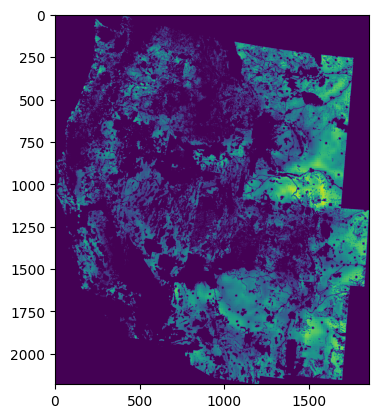

arizona total_generation: 2095221588 needed_generation: 27293103 difference: 2067928485.5290527 total land: 7185
california total_generation: 976790088 needed_generation: 154566960 difference: 822223128.0950928 total land: 55789
colorado total_generation: 1942543630 needed_generation: 69555893 difference: 1872987737.8892822 total land: 16392
idaho total_generation: 585508817 needed_generation: 12397083 difference: 573111734.1772766 total land: 3401
montana total_generation: 2730259975 needed_generation: 128392581 difference: 2601867394.5648804 total land: 31526
new_mexico total_generation: 2978790932 needed_generation: 46859963 difference: 2931930969.1173096 total land: 10254
nevada total_generation: 949412743 needed_generation: 9602251 difference: 939810492.7039185 total land: 3185
oregon total_generation: 816328785 needed_generation: 33197367 difference: 783131418.6260681 total land: 8263
utah total_generation: 414949069 needed_generation: 32291576 difference: 382657493.9838257 total

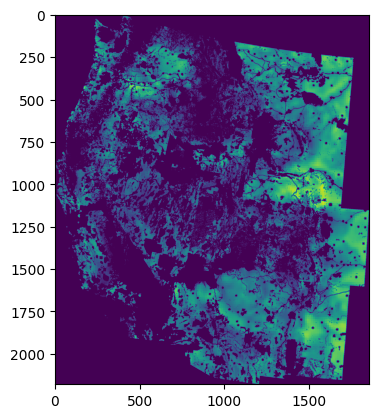

arizona total_generation: 2109638587 needed_generation: 27293103 difference: 2082345484.3675537 total land: 7185
california total_generation: 1061619624 needed_generation: 154566960 difference: 907052664.0255737 total land: 54350
colorado total_generation: 2128627764 needed_generation: 69555893 difference: 2059071871.4522095 total land: 16280
idaho total_generation: 591945898 needed_generation: 12397083 difference: 579548815.9677429 total land: 3401
montana total_generation: 3230311739 needed_generation: 128392581 difference: 3101919158.9661255 total land: 31189
new_mexico total_generation: 3343686481 needed_generation: 46859963 difference: 3296826518.670532 total land: 10166
nevada total_generation: 913547385 needed_generation: 9602251 difference: 903945134.0112915 total land: 3239
oregon total_generation: 1312417930 needed_generation: 33197367 difference: 1279220563.0662231 total land: 7988
utah total_generation: 444745096 needed_generation: 32291576 difference: 412453520.9842529 tot

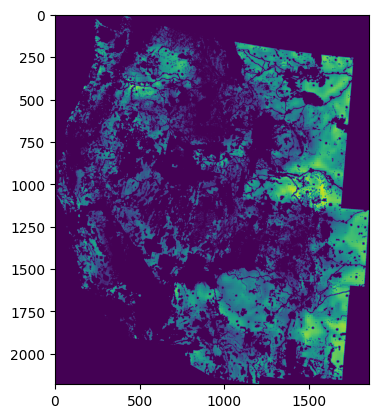

arizona total_generation: 1923739167 needed_generation: 27293103 difference: 1896446064.4456787 total land: 7248
california total_generation: 849338461 needed_generation: 154566960 difference: 694771501.0264587 total land: 60835
colorado total_generation: 1947483765 needed_generation: 69555893 difference: 1877927872.111084 total land: 16296
idaho total_generation: 490465228 needed_generation: 12397083 difference: 478068145.9328003 total land: 3417
montana total_generation: 2930191924 needed_generation: 128392581 difference: 2801799343.0753174 total land: 31257
new_mexico total_generation: 2946792272 needed_generation: 46859963 difference: 2899932309.852783 total land: 10173
nevada total_generation: 690183803 needed_generation: 9602251 difference: 680581552.0361938 total land: 3346
oregon total_generation: 1071854157 needed_generation: 33197367 difference: 1038656790.0420837 total land: 8191
utah total_generation: 346909392 needed_generation: 32291576 difference: 314617816.13897705 tota

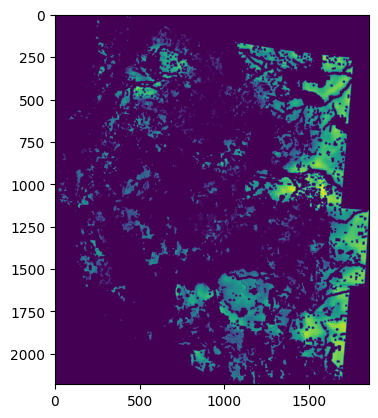

arizona total_generation: 1319629177 needed_generation: 27293103 difference: 1292336074.218628 total land: 7505
california total_generation: 304942099 needed_generation: 154566960 difference: 150375139.32373047 total land: 27622
colorado total_generation: 1374612989 needed_generation: 69555893 difference: 1305057096.2599487 total land: 16417
idaho total_generation: 201711966 needed_generation: 12397083 difference: 189314883.15631104 total land: 3586
montana total_generation: 1893832207 needed_generation: 128392581 difference: 1765439626.6773071 total land: 31720
new_mexico total_generation: 1879165992 needed_generation: 46859963 difference: 1832306029.88208 total land: 10197
nevada total_generation: 295822678 needed_generation: 9602251 difference: 286220427.24645996 total land: 3561
oregon total_generation: 470721724 needed_generation: 33197367 difference: 437524357.8023987 total land: 9019
utah total_generation: 152618273 needed_generation: 32291576 difference: 120326697.2043457 total

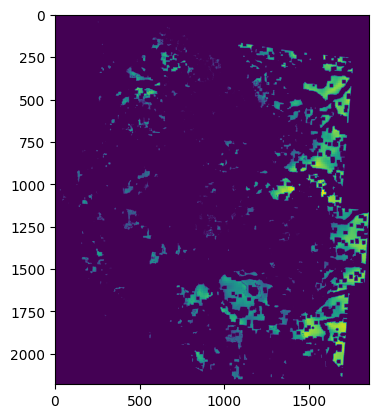

arizona total_generation: 790932021 needed_generation: 27293103 difference: 763638918.9750977 total land: 7876
california total_generation: 71220238 needed_generation: 154566960 difference: -83346721.04690552 total land: 6280
colorado total_generation: 821014502 needed_generation: 69555893 difference: 751458609.9830933 total land: 16769
idaho total_generation: 40466104 needed_generation: 12397083 difference: 28069021.678955078 total land: 3448
montana total_generation: 946747630 needed_generation: 128392581 difference: 818355049.7757568 total land: 32975
new_mexico total_generation: 1099368422 needed_generation: 46859963 difference: 1052508459.8662109 total land: 10248
nevada total_generation: 124930638 needed_generation: 9602251 difference: 115328387.14086914 total land: 3768
oregon total_generation: 159001132 needed_generation: 33197367 difference: 125803765.44934082 total land: 10847
utah total_generation: 46074640 needed_generation: 32291576 difference: 13783064.89477539 total land

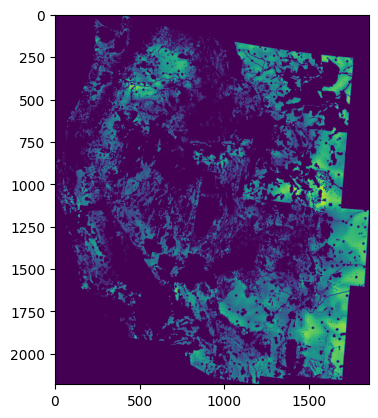

arizona total_generation: 1592261154 needed_generation: 27293103 difference: 1564968051.4573975 total land: 7331
california total_generation: 876521690 needed_generation: 154566960 difference: 721954730.9306335 total land: 60399
colorado total_generation: 2052000590 needed_generation: 69555893 difference: 1982444697.107727 total land: 16286
idaho total_generation: 475340376 needed_generation: 12397083 difference: 462943293.56051636 total land: 3423
montana total_generation: 1984264161 needed_generation: 128392581 difference: 1855871580.654663 total land: 32551
new_mexico total_generation: 3287342600 needed_generation: 46859963 difference: 3240482637.2026367 total land: 10166
nevada total_generation: 830592728 needed_generation: 9602251 difference: 820990477.2315063 total land: 3254
oregon total_generation: 941516113 needed_generation: 33197367 difference: 908318746.310852 total land: 8170
utah total_generation: 339457500 needed_generation: 32291576 difference: 307165924.4864502 total l

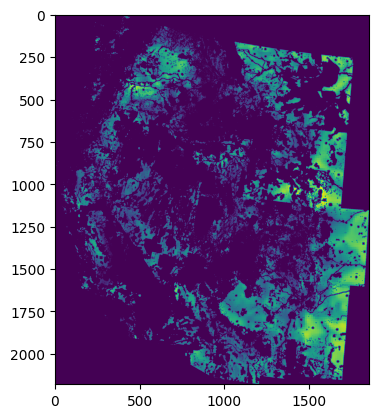

arizona total_generation: 1236415719 needed_generation: 27293103 difference: 1209122616.4641113 total land: 7483
california total_generation: 589447148 needed_generation: 154566960 difference: 434880188.7727356 total land: 54222
colorado total_generation: 1851040821 needed_generation: 69555893 difference: 1781484928.0336304 total land: 16303
idaho total_generation: 359764717 needed_generation: 12397083 difference: 347367634.9458618 total land: 3477
montana total_generation: 1666685800 needed_generation: 128392581 difference: 1538293219.065918 total land: 32973
new_mexico total_generation: 2839111561 needed_generation: 46859963 difference: 2792251598.0687256 total land: 10173
nevada total_generation: 608366018 needed_generation: 9602251 difference: 598763767.02948 total land: 3365
oregon total_generation: 658757869 needed_generation: 33197367 difference: 625560502.2875671 total land: 8545
utah total_generation: 213681560 needed_generation: 32291576 difference: 181389984.53619385 total l

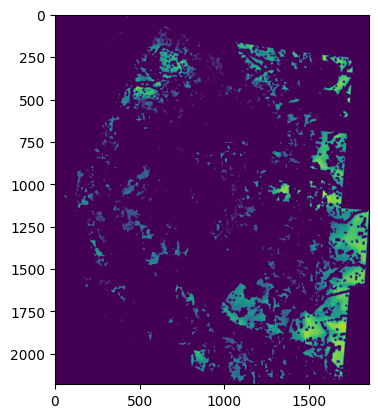

arizona total_generation: 666724086 needed_generation: 27293103 difference: 639430983.2561035 total land: 7934
california total_generation: 183345530 needed_generation: 154566960 difference: 28778570.96420288 total land: 17109
colorado total_generation: 1286382668 needed_generation: 69555893 difference: 1216826775.6898804 total land: 16425
idaho total_generation: 101180388 needed_generation: 12397083 difference: 88783305.37097168 total land: 4244
montana total_generation: 777974141 needed_generation: 128392581 difference: 649581560.5911865 total land: 36472
new_mexico total_generation: 1754842257 needed_generation: 46859963 difference: 1707982294.25708 total land: 10197
nevada total_generation: 246256381 needed_generation: 9602251 difference: 236654130.55517578 total land: 3584
oregon total_generation: 298971490 needed_generation: 33197367 difference: 265774123.5795288 total land: 9375
utah total_generation: 64810732 needed_generation: 32291576 difference: 32519156.232055664 total land

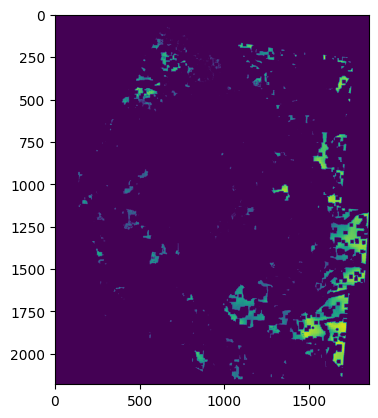

arizona total_generation: 316731997 needed_generation: 27293103 difference: 289438894.60498047 total land: 8607
california total_generation: 42976812 needed_generation: 154566960 difference: -111590147.91015625 total land: 3775
colorado total_generation: 765336303 needed_generation: 69555893 difference: 695780410.9971924 total land: 16786
idaho total_generation: 16023068 needed_generation: 12397083 difference: 3625985.842163086 total land: 1373
montana total_generation: 232159521 needed_generation: 128392581 difference: 103766940.58935547 total land: 14424
new_mexico total_generation: 1019218021 needed_generation: 46859963 difference: 972358058.2023926 total land: 10248
nevada total_generation: 105653298 needed_generation: 9602251 difference: 96051047.78845215 total land: 3797
oregon total_generation: 110197535 needed_generation: 33197367 difference: 77000168.28991699 total land: 7211
utah total_generation: 13513575 needed_generation: 32291576 difference: -18778000.954833984 total land

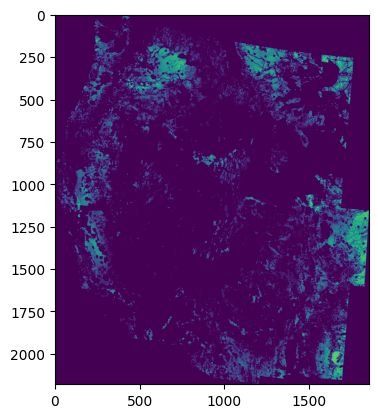

arizona total_generation: 245205883 needed_generation: 27293103 difference: 217912780.14575195 total land: 10324
california total_generation: 640310154 needed_generation: 154566960 difference: 485743194.32128906 total land: 59839
colorado total_generation: 1093998861 needed_generation: 69555893 difference: 1024442968.6073608 total land: 16561
idaho total_generation: 209626424 needed_generation: 12397083 difference: 197229341.21096802 total land: 3661
montana total_generation: 1043682427 needed_generation: 128392581 difference: 915289846.0199585 total land: 35757
new_mexico total_generation: 776906280 needed_generation: 46859963 difference: 730046317.1013184 total land: 10932
nevada total_generation: 43571871 needed_generation: 9602251 difference: 33969620.833496094 total land: 5088
oregon total_generation: 471038692 needed_generation: 33197367 difference: 437841325.02926636 total land: 8836
utah total_generation: 89626338 needed_generation: 32291576 difference: 57334762.57513428 total 

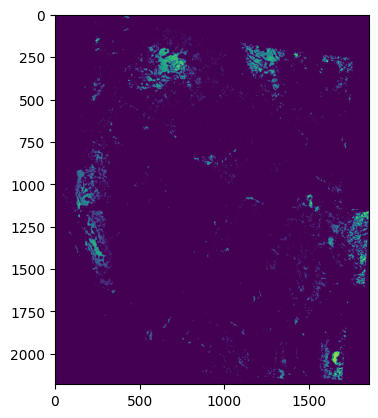

arizona total_generation: 26271173 needed_generation: 27293103 difference: -1021929.2512207031 total land: 2365
california total_generation: 361322847 needed_generation: 154566960 difference: 206755887.51068115 total land: 35023
colorado total_generation: 335448243 needed_generation: 69555893 difference: 265892350.47930908 total land: 20170
idaho total_generation: 69271837 needed_generation: 12397083 difference: 56874754.15484619 total land: 5034
montana total_generation: 341398215 needed_generation: 128392581 difference: 213005634.68969727 total land: 22174
new_mexico total_generation: 198820518 needed_generation: 46859963 difference: 151960555.29711914 total land: 12098
nevada total_generation: 3421295 needed_generation: 9602251 difference: -6180955.377441406 total land: 405
oregon total_generation: 75807696 needed_generation: 33197367 difference: 42610329.12060547 total land: 5629
utah total_generation: 17805224 needed_generation: 32291576 difference: -14486351.92956543 total land: 

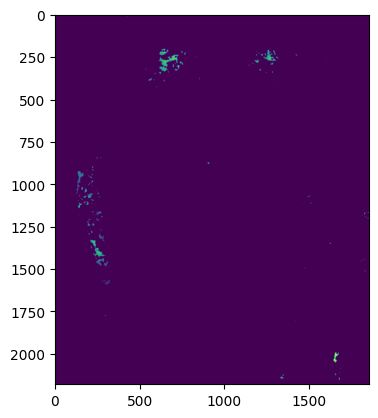

arizona total_generation: 0 needed_generation: 27293103 difference: -27293103.0 total land: 0
california total_generation: 90813750 needed_generation: 154566960 difference: -63753209.32495117 total land: 8503
colorado total_generation: 2125728 needed_generation: 69555893 difference: -67430164.98303223 total land: 117
idaho total_generation: 1177407 needed_generation: 12397083 difference: -11219675.018127441 total land: 106
montana total_generation: 34412491 needed_generation: 128392581 difference: -93980089.76831055 total land: 2281
new_mexico total_generation: 19973514 needed_generation: 46859963 difference: -26886448.86669922 total land: 979
nevada total_generation: 0 needed_generation: 9602251 difference: -9602251.0 total land: 0
oregon total_generation: 187338 needed_generation: 33197367 difference: -33010028.728515625 total land: 12
utah total_generation: 0 needed_generation: 32291576 difference: -32291576.0 total land: 0
washington total_generation: 82652272 needed_generation: 30

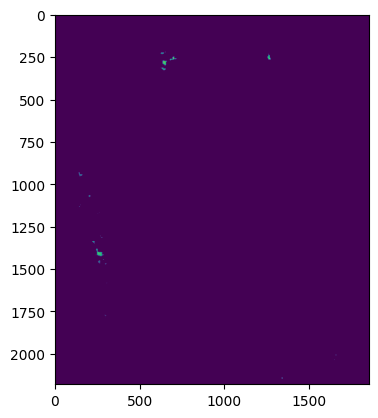

arizona total_generation: 0 needed_generation: 27293103 difference: -27293103.0 total land: 0
california total_generation: 16462160 needed_generation: 154566960 difference: -138104799.29473877 total land: 1284
colorado total_generation: 0 needed_generation: 69555893 difference: -69555893.0 total land: 0
idaho total_generation: 0 needed_generation: 12397083 difference: -12397083.0 total land: 0
montana total_generation: 4595431 needed_generation: 128392581 difference: -123797149.73779297 total land: 295
new_mexico total_generation: 505606 needed_generation: 46859963 difference: -46354356.537597656 total land: 30
nevada total_generation: 0 needed_generation: 9602251 difference: -9602251.0 total land: 0
oregon total_generation: 0 needed_generation: 33197367 difference: -33197367.0 total land: 0
utah total_generation: 0 needed_generation: 32291576 difference: -32291576.0 total land: 0
washington total_generation: 14989014 needed_generation: 30759188 difference: -15770173.775146484 total la

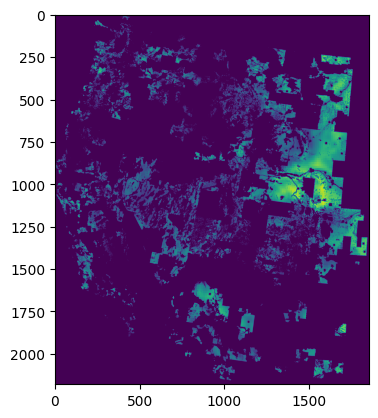

arizona total_generation: 611120716 needed_generation: 27293103 difference: 583827613.1895752 total land: 7660
california total_generation: 419901988 needed_generation: 154566960 difference: 265335028.78585815 total land: 35778
colorado total_generation: 979078945 needed_generation: 69555893 difference: 909523052.3900146 total land: 17654
idaho total_generation: 244318460 needed_generation: 12397083 difference: 231921377.97503662 total land: 3534
montana total_generation: 1375574308 needed_generation: 128392581 difference: 1247181727.489685 total land: 33269
new_mexico total_generation: 277397739 needed_generation: 46859963 difference: 230537776.38964844 total land: 14329
nevada total_generation: 671143750 needed_generation: 9602251 difference: 661541499.779419 total land: 3427
oregon total_generation: 234915770 needed_generation: 33197367 difference: 201718403.7952881 total land: 9987
utah total_generation: 247072207 needed_generation: 32291576 difference: 214780631.21710205 total lan

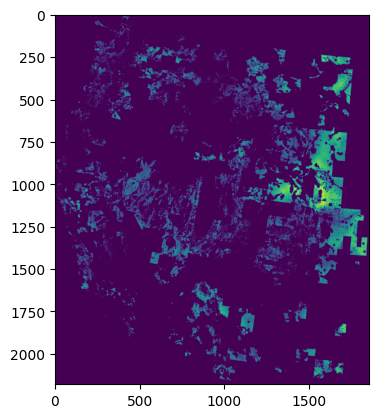

arizona total_generation: 446204525 needed_generation: 27293103 difference: 418911422.7183838 total land: 7903
california total_generation: 334046893 needed_generation: 154566960 difference: 179479933.45413208 total land: 29597
colorado total_generation: 943076381 needed_generation: 69555893 difference: 873520488.6647339 total land: 17671
idaho total_generation: 192003558 needed_generation: 12397083 difference: 179606475.3682251 total land: 3605
montana total_generation: 822780322 needed_generation: 128392581 difference: 694387741.8192139 total land: 36435
new_mexico total_generation: 274708274 needed_generation: 46859963 difference: 227848311.37194824 total land: 14381
nevada total_generation: 603571206 needed_generation: 9602251 difference: 593968955.0870361 total land: 3445
oregon total_generation: 170402221 needed_generation: 33197367 difference: 137204854.22131348 total land: 11640
utah total_generation: 202399547 needed_generation: 32291576 difference: 170107971.13287354 total la

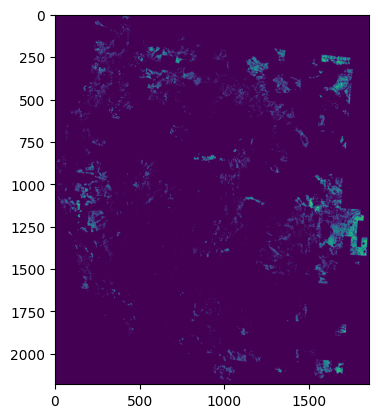

arizona total_generation: 60776544 needed_generation: 27293103 difference: 33483441.137573242 total land: 5618
california total_generation: 239144323 needed_generation: 154566960 difference: 84577363.32138062 total land: 22018
colorado total_generation: 545890917 needed_generation: 69555893 difference: 476335024.46673584 total land: 18777
idaho total_generation: 82972639 needed_generation: 12397083 difference: 70575556.9395752 total land: 4761
montana total_generation: 412114334 needed_generation: 128392581 difference: 283721753.2614746 total land: 26920
new_mexico total_generation: 115709495 needed_generation: 46859963 difference: 68849532.94909668 total land: 7220
nevada total_generation: 36060076 needed_generation: 9602251 difference: 26457825.342163086 total land: 4233
oregon total_generation: 102888676 needed_generation: 33197367 difference: 69691309.98059082 total land: 7248
utah total_generation: 60283327 needed_generation: 32291576 difference: 27991751.659301758 total land: 597

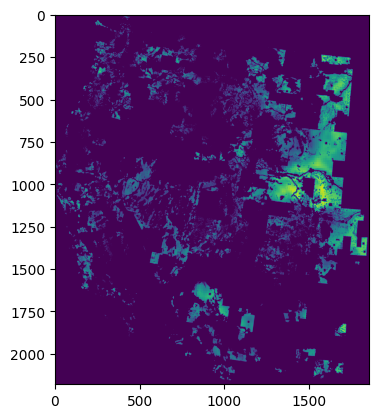

arizona total_generation: 540539655 needed_generation: 27293103 difference: 513246552.546875 total land: 7727
california total_generation: 335627883 needed_generation: 154566960 difference: 181060923.06854248 total land: 28672
colorado total_generation: 883770333 needed_generation: 69555893 difference: 814214440.1890869 total land: 17720
idaho total_generation: 198555681 needed_generation: 12397083 difference: 186158598.6732788 total land: 3608
montana total_generation: 1246932193 needed_generation: 128392581 difference: 1118539612.1530762 total land: 33408
new_mexico total_generation: 228526530 needed_generation: 46859963 difference: 181666567.93566895 total land: 15554
nevada total_generation: 500227087 needed_generation: 9602251 difference: 490624836.2055054 total land: 3477
oregon total_generation: 184321318 needed_generation: 33197367 difference: 151123951.47595215 total land: 10853
utah total_generation: 192619229 needed_generation: 32291576 difference: 160327653.64019775 total l

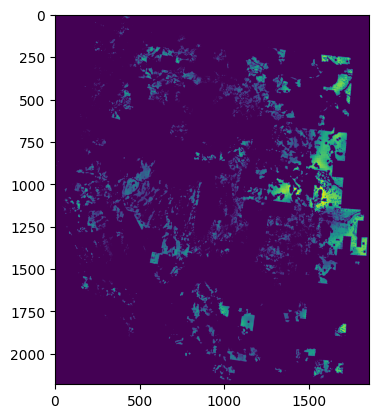

arizona total_generation: 319113880 needed_generation: 27293103 difference: 291820777.1446533 total land: 8708
california total_generation: 208560314 needed_generation: 154566960 difference: 53993354.299316406 total land: 19525
colorado total_generation: 829421479 needed_generation: 69555893 difference: 759865586.8605347 total land: 17741
idaho total_generation: 138735677 needed_generation: 12397083 difference: 126338594.30621338 total land: 3862
montana total_generation: 687968657 needed_generation: 128392581 difference: 559576076.529602 total land: 39024
new_mexico total_generation: 222627595 needed_generation: 46859963 difference: 175767632.7800293 total land: 15074
nevada total_generation: 435227507 needed_generation: 9602251 difference: 425625256.96051025 total land: 3509
oregon total_generation: 95980640 needed_generation: 33197367 difference: 62783273.53161621 total land: 7105
utah total_generation: 132668047 needed_generation: 32291576 difference: 100376471.16583252 total land:

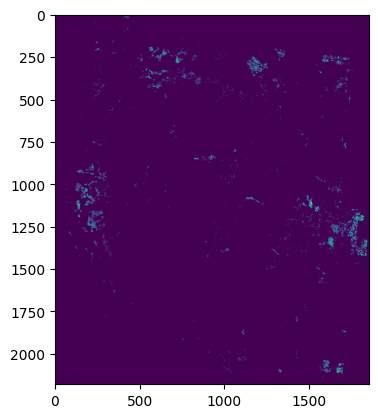

arizona total_generation: 6925774 needed_generation: 27293103 difference: -20367328.314941406 total land: 652
california total_generation: 124571429 needed_generation: 154566960 difference: -29995530.901184082 total land: 12276
colorado total_generation: 169607492 needed_generation: 69555893 difference: 100051599.3413086 total land: 10813
idaho total_generation: 26997283 needed_generation: 12397083 difference: 14600200.518676758 total land: 2474
montana total_generation: 97416478 needed_generation: 128392581 difference: -30976102.376342773 total land: 6096
new_mexico total_generation: 38699595 needed_generation: 46859963 difference: -8160367.260253906 total land: 2382
nevada total_generation: 3219208 needed_generation: 9602251 difference: -6383042.119995117 total land: 381
oregon total_generation: 15902094 needed_generation: 33197367 difference: -17295272.833129883 total land: 1198
utah total_generation: 13559361 needed_generation: 32291576 difference: -18732214.954467773 total land: 1

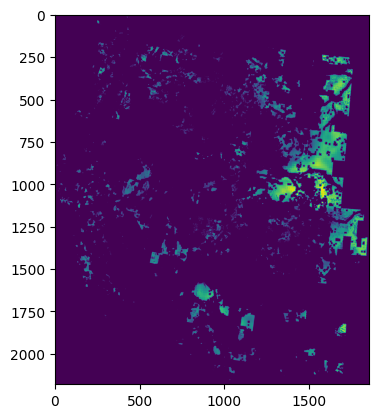

arizona total_generation: 347037748 needed_generation: 27293103 difference: 319744645.805542 total land: 8052
california total_generation: 111050107 needed_generation: 154566960 difference: -43516852.89398193 total land: 9373
colorado total_generation: 597682980 needed_generation: 69555893 difference: 528127087.0872803 total land: 18206
idaho total_generation: 70698695 needed_generation: 12397083 difference: 58301612.167541504 total land: 5118
montana total_generation: 823839826 needed_generation: 128392581 difference: 695447245.2969971 total land: 34608
new_mexico total_generation: 121910327 needed_generation: 46859963 difference: 75050364.05627441 total land: 7704
nevada total_generation: 212735093 needed_generation: 9602251 difference: 203132842.91235352 total land: 3633
oregon total_generation: 66298743 needed_generation: 33197367 difference: 33101376.068847656 total land: 4449
utah total_generation: 79648525 needed_generation: 32291576 difference: 47356949.29022217 total land: 792

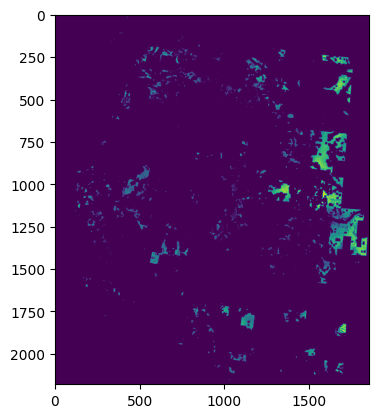

arizona total_generation: 137654191 needed_generation: 27293103 difference: 110361088.05773926 total land: 11073
california total_generation: 54915722 needed_generation: 154566960 difference: -99651237.5515747 total land: 5094
colorado total_generation: 550404762 needed_generation: 69555893 difference: 480848869.0062256 total land: 18238
idaho total_generation: 33143878 needed_generation: 12397083 difference: 20746795.471679688 total land: 3130
montana total_generation: 334667736 needed_generation: 128392581 difference: 206275155.5258789 total land: 19933
new_mexico total_generation: 116720947 needed_generation: 46859963 difference: 69860984.8326416 total land: 7219
nevada total_generation: 171848156 needed_generation: 9602251 difference: 162245905.75598145 total land: 3668
oregon total_generation: 39417930 needed_generation: 33197367 difference: 6220563.368652344 total land: 2725
utah total_generation: 37769646 needed_generation: 32291576 difference: 5478070.879577637 total land: 4045

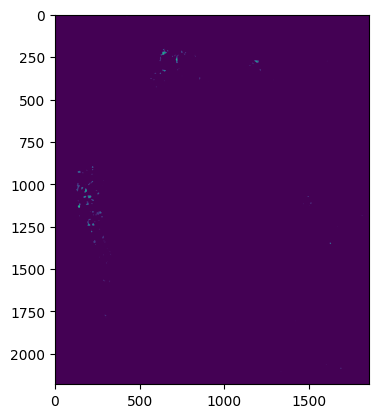

arizona total_generation: 0 needed_generation: 27293103 difference: -27293103.0 total land: 0
california total_generation: 24944206 needed_generation: 154566960 difference: -129622753.23348999 total land: 2296
colorado total_generation: 442835 needed_generation: 69555893 difference: -69113057.43115234 total land: 25
idaho total_generation: 325838 needed_generation: 12397083 difference: -12071244.671447754 total land: 44
montana total_generation: 2626878 needed_generation: 128392581 difference: -125765702.9946289 total land: 166
new_mexico total_generation: 177512 needed_generation: 46859963 difference: -46682450.30957031 total land: 10
nevada total_generation: 0 needed_generation: 9602251 difference: -9602251.0 total land: 0
oregon total_generation: 63316 needed_generation: 33197367 difference: -33134050.77685547 total land: 4
utah total_generation: 0 needed_generation: 32291576 difference: -32291576.0 total land: 0
washington total_generation: 10994329 needed_generation: 30759188 diff

In [26]:
tech_type = 'Wind'
wind_power_density = 12

# open wind potential raster file
wind_array = rasterio.open(wind_potential_path).read(1)
show(wind_array)

# for each analysis combination
for analysis_name in exclusion_combos:

    # combine the wind potential raster with the additional exclusions
    exclusion_list = exclusion_combos[analysis_name]
    print(analysis_name)
    print(exclusion_list)
    
    if exclusion_list is None:

        final_raster = wind_array
        
    else:
        for exc in exclusion_list:
            
            exclusion_array = rasterio.open(exc).read(1)
            
            exclusion_array = np.where(exclusion_array==1, 1, 0)
            
            if exclusion_list[0] == exc:
                combined_exclusion = exclusion_array
            else:
                combined_exclusion += exclusion_array

        
        combined_exclusion = np.where(combined_exclusion >=1, 0, 1)
        
        final_raster = wind_array*combined_exclusion
    show(final_raster)

    # loop through each state
    for state in output_dict:
        state_id = state_settings_dict[state]['id_no']
        state_array = np.where(conus_array==state_id, 1, 0)
        state_array = np.where(state_array==0, 0, 1)
        
        state_raster = state_array*final_raster

        total_generation = (state_raster * wind_power_density).sum()
        target_generation = net_zero_dict[state]['clean_grid_mwh']

        # calculate the amount of land required to meet generation goals
        state_raster_list = state_raster.flatten()
        state_raster_list = [i for i in state_raster_list if i != 0]
        state_raster_list.sort()
        
        target_generation = net_zero_dict[state]['clean_grid_mwh']
        total_km = 0
        total_gen = 0
        for i in state_raster_list[::-1]:
            if total_gen < target_generation:
                if total_km == len(state_raster_list):
                    total_km = len(state_raster_list)
                else:
                    total_km += 1
                    total_gen += i
            else:
                pass
        print(state, f'total_generation: {int(total_generation)}', 
                      f'needed_generation: {int(target_generation)}', 
                      f'difference: {total_generation-target_generation}', 
                      f'total land: {total_km}')
        #show(state_raster)
        output_dict[state][tech_type][analysis_name]['total_gen'] = total_generation
        output_dict[state][tech_type][analysis_name]['total_km'] = total_km

## Solar Analysis

### Calculate Solar Generation Availability by Scenario 

baseline


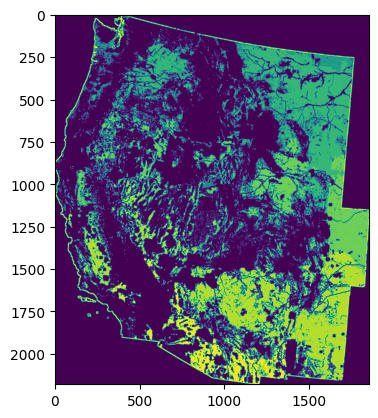

arizona total_generation: 6685026145 needed_generation: 27293103 difference: 6584235495 total land: 577
california total_generation: 2714711175 needed_generation: 154566960 difference: 2613920525 total land: 3268
colorado total_generation: 5174643391 needed_generation: 69555893 difference: 5073852741 total land: 1655
idaho total_generation: 1082900268 needed_generation: 12397083 difference: 982109618 total land: 337
montana total_generation: 6709037420 needed_generation: 128392581 difference: 6608246770 total land: 4072
new_mexico total_generation: 8685880006 needed_generation: 46859963 difference: 8585089356 total land: 991
nevada total_generation: 2942689804 needed_generation: 9602251 difference: 2841899154 total land: 203
oregon total_generation: 2211870977 needed_generation: 33197367 difference: 2111080327 total land: 903
utah total_generation: 1401506602 needed_generation: 32291576 difference: 1300715952 total land: 768
washington total_generation: 1659018798 needed_generation: 30

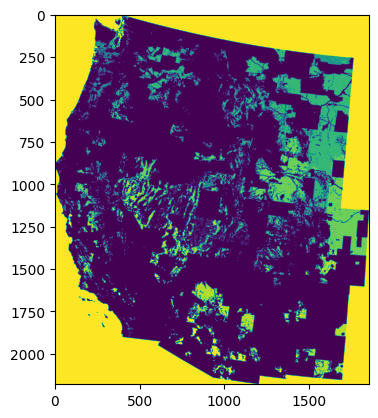

arizona total_generation: 1887610127 needed_generation: 27293103 difference: 1786819477 total land: 577
california total_generation: 971354671 needed_generation: 154566960 difference: 870564021 total land: 3544
colorado total_generation: 2494787769 needed_generation: 69555893 difference: 2393997119 total land: 1655
idaho total_generation: 400947544 needed_generation: 12397083 difference: 300156894 total land: 337
montana total_generation: 3323539760 needed_generation: 128392581 difference: 3222749110 total land: 4072
new_mexico total_generation: 911888336 needed_generation: 46859963 difference: 811097686 total land: 991
nevada total_generation: 2149203626 needed_generation: 9602251 difference: 2048412976 total land: 203
oregon total_generation: 596024277 needed_generation: 33197367 difference: 495233627 total land: 903
utah total_generation: 832549935 needed_generation: 32291576 difference: 731759285 total land: 768
washington total_generation: 819023844 needed_generation: 30759188 dif

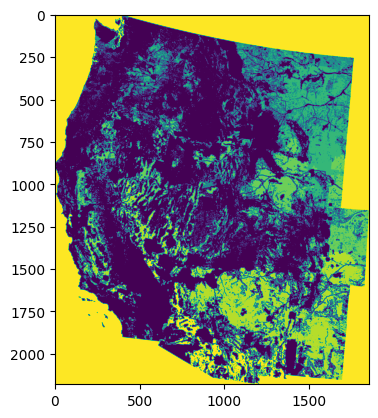

arizona total_generation: 6571803695 needed_generation: 27293103 difference: 6471013045 total land: 577
california total_generation: 2281319752 needed_generation: 154566960 difference: 2180529102 total land: 3268
colorado total_generation: 4682724244 needed_generation: 69555893 difference: 4581933594 total land: 1655
idaho total_generation: 1047433631 needed_generation: 12397083 difference: 946642981 total land: 337
montana total_generation: 5639861075 needed_generation: 128392581 difference: 5539070425 total land: 4072
new_mexico total_generation: 7722301063 needed_generation: 46859963 difference: 7621510413 total land: 991
nevada total_generation: 2941770004 needed_generation: 9602251 difference: 2840979354 total land: 203
oregon total_generation: 1248694445 needed_generation: 33197367 difference: 1147903795 total land: 903
utah total_generation: 1249897311 needed_generation: 32291576 difference: 1149106661 total land: 768
washington total_generation: 903541332 needed_generation: 307

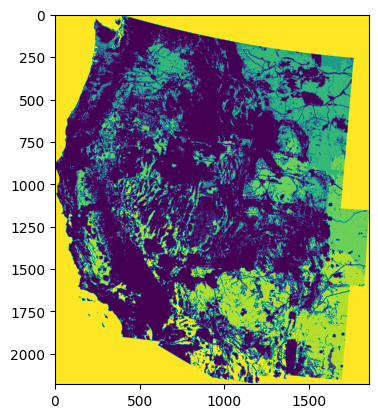

arizona total_generation: 6634711382 needed_generation: 27293103 difference: 6533920732 total land: 577
california total_generation: 2691437692 needed_generation: 154566960 difference: 2590647042 total land: 3268
colorado total_generation: 4940553250 needed_generation: 69555893 difference: 4839762600 total land: 1655
idaho total_generation: 977003472 needed_generation: 12397083 difference: 876212822 total land: 337
montana total_generation: 5763259435 needed_generation: 128392581 difference: 5662468785 total land: 4072
new_mexico total_generation: 8672524515 needed_generation: 46859963 difference: 8571733865 total land: 991
nevada total_generation: 2816861166 needed_generation: 9602251 difference: 2716070516 total land: 203
oregon total_generation: 2050108285 needed_generation: 33197367 difference: 1949317635 total land: 903
utah total_generation: 1181306641 needed_generation: 32291576 difference: 1080515991 total land: 768
washington total_generation: 1626369563 needed_generation: 307

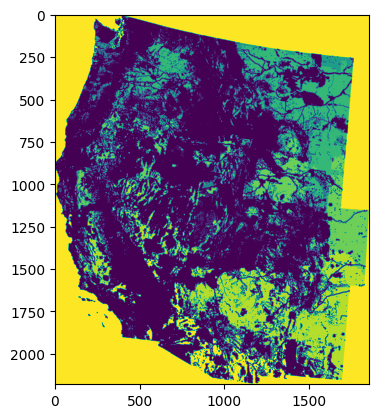

arizona total_generation: 5993423874 needed_generation: 27293103 difference: 5892633224 total land: 577
california total_generation: 2175563001 needed_generation: 154566960 difference: 2074772351 total land: 3268
colorado total_generation: 4502865881 needed_generation: 69555893 difference: 4402075231 total land: 1655
idaho total_generation: 781824003 needed_generation: 12397083 difference: 681033353 total land: 337
montana total_generation: 5196689600 needed_generation: 128392581 difference: 5095898950 total land: 4072
new_mexico total_generation: 7540657130 needed_generation: 46859963 difference: 7439866480 total land: 991
nevada total_generation: 2189652634 needed_generation: 9602251 difference: 2088861984 total land: 203
oregon total_generation: 1653794104 needed_generation: 33197367 difference: 1553003454 total land: 903
utah total_generation: 901592926 needed_generation: 32291576 difference: 800802276 total land: 768
washington total_generation: 1404891265 needed_generation: 30759

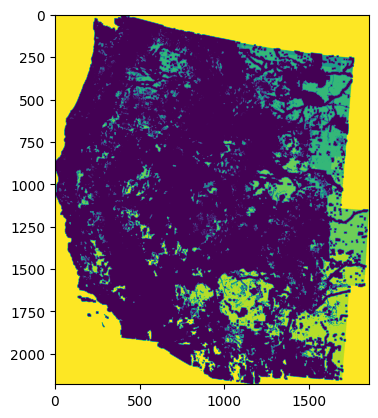

arizona total_generation: 3909300849 needed_generation: 27293103 difference: 3808510199 total land: 577
california total_generation: 871195242 needed_generation: 154566960 difference: 770404592 total land: 3362
colorado total_generation: 3099115791 needed_generation: 69555893 difference: 2998325141 total land: 1655
idaho total_generation: 295445650 needed_generation: 12397083 difference: 194655000 total land: 337
montana total_generation: 3219670435 needed_generation: 128392581 difference: 3118879785 total land: 4072
new_mexico total_generation: 4549416419 needed_generation: 46859963 difference: 4448625769 total land: 991
nevada total_generation: 878171325 needed_generation: 9602251 difference: 777380675 total land: 203
oregon total_generation: 668962316 needed_generation: 33197367 difference: 568171666 total land: 903
utah total_generation: 410740566 needed_generation: 32291576 difference: 309949916 total land: 768
washington total_generation: 708729325 needed_generation: 30759188 dif

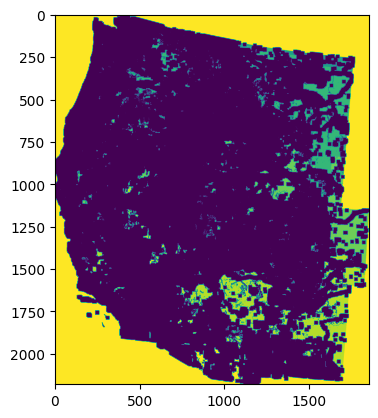

arizona total_generation: 2248366843 needed_generation: 27293103 difference: 2147576193 total land: 577
california total_generation: 214254997 needed_generation: 154566960 difference: 113464347 total land: 3608
colorado total_generation: 1787565550 needed_generation: 69555893 difference: 1686774900 total land: 1655
idaho total_generation: 63854215 needed_generation: 12397083 difference: -36936435 total land: 337
montana total_generation: 1547757990 needed_generation: 128392581 difference: 1446967340 total land: 4072
new_mexico total_generation: 2513308429 needed_generation: 46859963 difference: 2412517779 total land: 1066
nevada total_generation: 336777772 needed_generation: 9602251 difference: 235987122 total land: 203
oregon total_generation: 192286839 needed_generation: 33197367 difference: 91496189 total land: 903
utah total_generation: 139851647 needed_generation: 32291576 difference: 39060997 total land: 768
washington total_generation: 259065305 needed_generation: 30759188 diffe

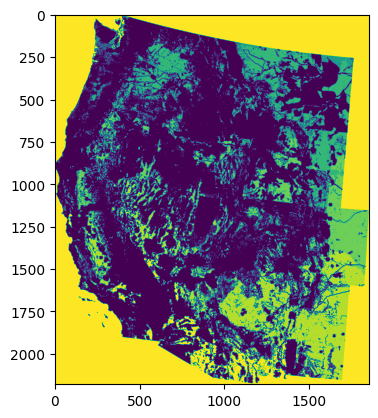

arizona total_generation: 5156717033 needed_generation: 27293103 difference: 5055926383 total land: 577
california total_generation: 2373344809 needed_generation: 154566960 difference: 2272554159 total land: 3268
colorado total_generation: 4784439797 needed_generation: 69555893 difference: 4683649147 total land: 1655
idaho total_generation: 976015352 needed_generation: 12397083 difference: 875224702 total land: 337
montana total_generation: 3705466135 needed_generation: 128392581 difference: 3604675485 total land: 4072
new_mexico total_generation: 8564818577 needed_generation: 46859963 difference: 8464027927 total land: 991
nevada total_generation: 2602905177 needed_generation: 9602251 difference: 2502114527 total land: 203
oregon total_generation: 1475346058 needed_generation: 33197367 difference: 1374555408 total land: 903
utah total_generation: 850609633 needed_generation: 32291576 difference: 749818983 total land: 768
washington total_generation: 1491191562 needed_generation: 30759

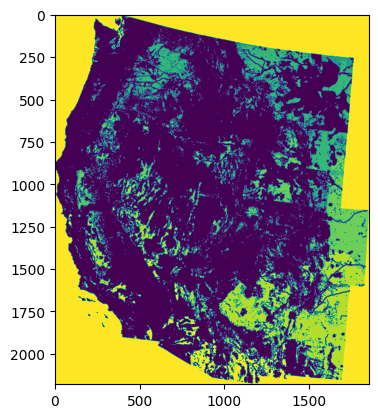

arizona total_generation: 3995390283 needed_generation: 27293103 difference: 3894599633 total land: 577
california total_generation: 1697603625 needed_generation: 154566960 difference: 1596812975 total land: 3268
colorado total_generation: 4314922082 needed_generation: 69555893 difference: 4214131432 total land: 1655
idaho total_generation: 720329618 needed_generation: 12397083 difference: 619538968 total land: 337
montana total_generation: 3041657610 needed_generation: 128392581 difference: 2940866960 total land: 4072
new_mexico total_generation: 7320441312 needed_generation: 46859963 difference: 7219650662 total land: 991
nevada total_generation: 1962120406 needed_generation: 9602251 difference: 1861329756 total land: 203
oregon total_generation: 1043370683 needed_generation: 33197367 difference: 942580033 total land: 903
utah total_generation: 499708654 needed_generation: 32291576 difference: 398918004 total land: 768
washington total_generation: 1194915688 needed_generation: 307591

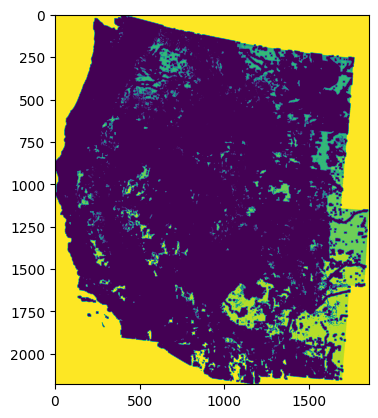

arizona total_generation: 2079913539 needed_generation: 27293103 difference: 1979122889 total land: 577
california total_generation: 595833504 needed_generation: 154566960 difference: 495042854 total land: 3374
colorado total_generation: 2911949818 needed_generation: 69555893 difference: 2811159168 total land: 1655
idaho total_generation: 169707932 needed_generation: 12397083 difference: 68917282 total land: 337
montana total_generation: 1331629070 needed_generation: 128392581 difference: 1230838420 total land: 4072
new_mexico total_generation: 4256615274 needed_generation: 46859963 difference: 4155824624 total land: 991
nevada total_generation: 739454976 needed_generation: 9602251 difference: 638664326 total land: 203
oregon total_generation: 391184570 needed_generation: 33197367 difference: 290393920 total land: 903
utah total_generation: 132882126 needed_generation: 32291576 difference: 32091476 total land: 859
washington total_generation: 621644390 needed_generation: 30759188 diffe

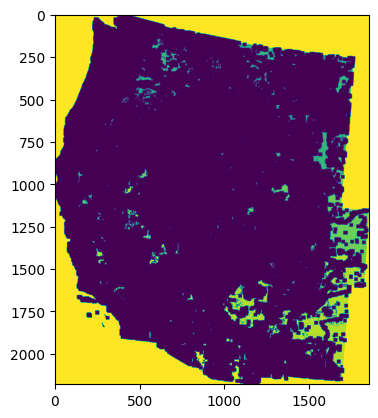

arizona total_generation: 971533860 needed_generation: 27293103 difference: 870743210 total land: 577
california total_generation: 140050830 needed_generation: 154566960 difference: 39260180 total land: 3407
colorado total_generation: 1669210974 needed_generation: 69555893 difference: 1568420324 total land: 1655
idaho total_generation: 20545180 needed_generation: 12397083 difference: -80245470 total land: 384
montana total_generation: 379777625 needed_generation: 128392581 difference: 278986975 total land: 4072
new_mexico total_generation: 2309811877 needed_generation: 46859963 difference: 2209021227 total land: 1066
nevada total_generation: 286078396 needed_generation: 9602251 difference: 185287746 total land: 203
oregon total_generation: 105689703 needed_generation: 33197367 difference: 4899053 total land: 1032
utah total_generation: 36140255 needed_generation: 32291576 difference: -64650395 total land: 878
washington total_generation: 221601705 needed_generation: 30759188 difference

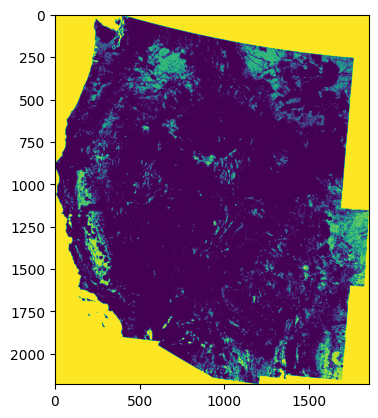

arizona total_generation: 897527715 needed_generation: 27293103 difference: 796737065 total land: 577
california total_generation: 1852642689 needed_generation: 154566960 difference: 1751852039 total land: 3359
colorado total_generation: 2386953162 needed_generation: 69555893 difference: 2286162512 total land: 1655
idaho total_generation: 424342433 needed_generation: 12397083 difference: 323551783 total land: 337
montana total_generation: 1966935220 needed_generation: 128392581 difference: 1866144570 total land: 4072
new_mexico total_generation: 2011355405 needed_generation: 46859963 difference: 1910564755 total land: 991
nevada total_generation: 165669083 needed_generation: 9602251 difference: 64878433 total land: 224
oregon total_generation: 744337375 needed_generation: 33197367 difference: 643546725 total land: 903
utah total_generation: 247583686 needed_generation: 32291576 difference: 146793036 total land: 768
washington total_generation: 1202592474 needed_generation: 30759188 dif

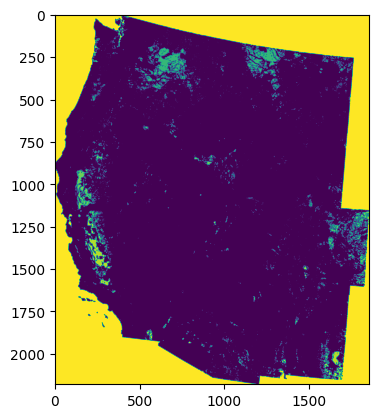

arizona total_generation: 106500681 needed_generation: 27293103 difference: 5710031 total land: 577
california total_generation: 1152986681 needed_generation: 154566960 difference: 1052196031 total land: 3550
colorado total_generation: 701880636 needed_generation: 69555893 difference: 601089986 total land: 1655
idaho total_generation: 139755093 needed_generation: 12397083 difference: 38964443 total land: 337
montana total_generation: 675234820 needed_generation: 128392581 difference: 574444170 total land: 4072
new_mexico total_generation: 502492504 needed_generation: 46859963 difference: 401701854 total land: 991
nevada total_generation: 15310728 needed_generation: 9602251 difference: -85479922 total land: 243
oregon total_generation: 150681348 needed_generation: 33197367 difference: 49890698 total land: 903
utah total_generation: 41401453 needed_generation: 32291576 difference: -59389197 total land: 850
washington total_generation: 678229383 needed_generation: 30759188 difference: 577

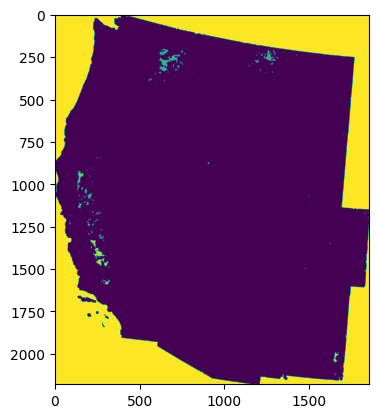

arizona total_generation: 0 needed_generation: 27293103 difference: -100790650 total land: 0
california total_generation: 314939520 needed_generation: 154566960 difference: 214148870 total land: 3676
colorado total_generation: 4604256 needed_generation: 69555893 difference: -96186394 total land: 123
idaho total_generation: 2496594 needed_generation: 12397083 difference: -98294056 total land: 69
montana total_generation: 73812925 needed_generation: 128392581 difference: -26977725 total land: 2341
new_mexico total_generation: 46142205 needed_generation: 46859963 difference: -54648445 total land: 1070
nevada total_generation: 0 needed_generation: 9602251 difference: -100790650 total land: 0
oregon total_generation: 409955 needed_generation: 33197367 difference: -100380695 total land: 13
utah total_generation: 0 needed_generation: 32291576 difference: -100790650 total land: 0
washington total_generation: 167561225 needed_generation: 30759188 difference: 66770575 total land: 976
wyoming tot

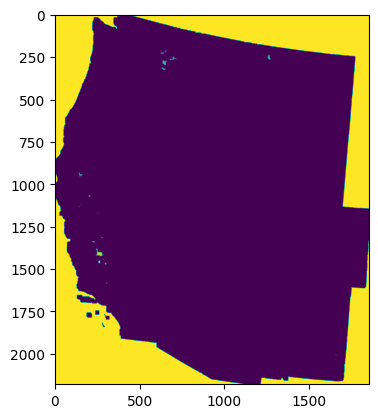

arizona total_generation: 0 needed_generation: 27293103 difference: -100790650 total land: 0
california total_generation: 53385192 needed_generation: 154566960 difference: -47405458 total land: 1300
colorado total_generation: 0 needed_generation: 69555893 difference: -100790650 total land: 0
idaho total_generation: 0 needed_generation: 12397083 difference: -100790650 total land: 0
montana total_generation: 9302825 needed_generation: 128392581 difference: -91487825 total land: 295
new_mexico total_generation: 1377050 needed_generation: 46859963 difference: -99413600 total land: 30
nevada total_generation: 0 needed_generation: 9602251 difference: -100790650 total land: 0
oregon total_generation: 0 needed_generation: 33197367 difference: -100790650 total land: 0
utah total_generation: 0 needed_generation: 32291576 difference: -100790650 total land: 0
washington total_generation: 30052855 needed_generation: 30759188 difference: -70737795 total land: 953
wyoming total_generation: 0 needed_g

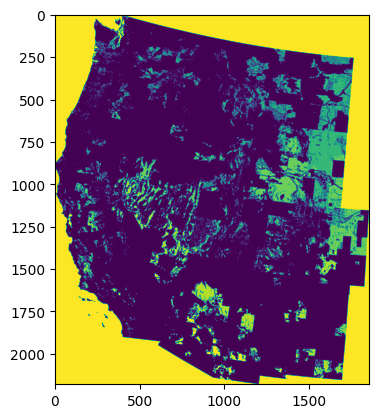

arizona total_generation: 1864541908 needed_generation: 27293103 difference: 1763751258 total land: 577
california total_generation: 847812636 needed_generation: 154566960 difference: 747021986 total land: 3572
colorado total_generation: 2164644321 needed_generation: 69555893 difference: 2063853671 total land: 1655
idaho total_generation: 368523626 needed_generation: 12397083 difference: 267732976 total land: 337
montana total_generation: 2310081575 needed_generation: 128392581 difference: 2209290925 total land: 4072
new_mexico total_generation: 775016977 needed_generation: 46859963 difference: 674226327 total land: 991
nevada total_generation: 2046149234 needed_generation: 9602251 difference: 1945358584 total land: 203
oregon total_generation: 281106818 needed_generation: 33197367 difference: 180316168 total land: 903
utah total_generation: 583205408 needed_generation: 32291576 difference: 482414758 total land: 768
washington total_generation: 412255872 needed_generation: 30759188 dif

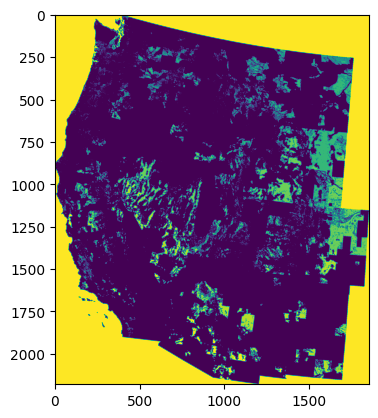

arizona total_generation: 1425268964 needed_generation: 27293103 difference: 1324478314 total land: 577
california total_generation: 726872241 needed_generation: 154566960 difference: 626081591 total land: 3572
colorado total_generation: 2105283300 needed_generation: 69555893 difference: 2004492650 total land: 1655
idaho total_generation: 368360694 needed_generation: 12397083 difference: 267570044 total land: 337
montana total_generation: 1410419045 needed_generation: 128392581 difference: 1309628395 total land: 4072
new_mexico total_generation: 769866109 needed_generation: 46859963 difference: 669075459 total land: 991
nevada total_generation: 1879187139 needed_generation: 9602251 difference: 1778396489 total land: 203
oregon total_generation: 244451782 needed_generation: 33197367 difference: 143661132 total land: 903
utah total_generation: 442686248 needed_generation: 32291576 difference: 341895598 total land: 768
washington total_generation: 371485114 needed_generation: 30759188 dif

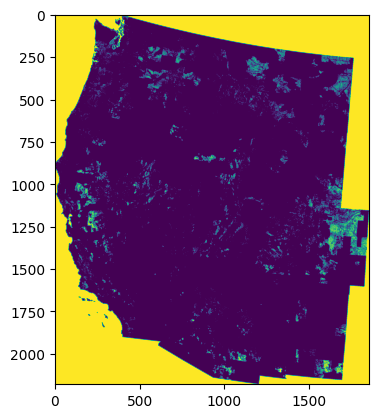

arizona total_generation: 216896125 needed_generation: 27293103 difference: 116105475 total land: 577
california total_generation: 571179655 needed_generation: 154566960 difference: 470389005 total land: 3645
colorado total_generation: 1152208452 needed_generation: 69555893 difference: 1051417802 total land: 1655
idaho total_generation: 170596724 needed_generation: 12397083 difference: 69806074 total land: 337
montana total_generation: 690315225 needed_generation: 128392581 difference: 589524575 total land: 4072
new_mexico total_generation: 314534076 needed_generation: 46859963 difference: 213743426 total land: 1023
nevada total_generation: 134900479 needed_generation: 9602251 difference: 34109829 total land: 227
oregon total_generation: 143507290 needed_generation: 33197367 difference: 42716640 total land: 922
utah total_generation: 136466610 needed_generation: 32291576 difference: 35675960 total land: 786
washington total_generation: 291128025 needed_generation: 30759188 difference: 

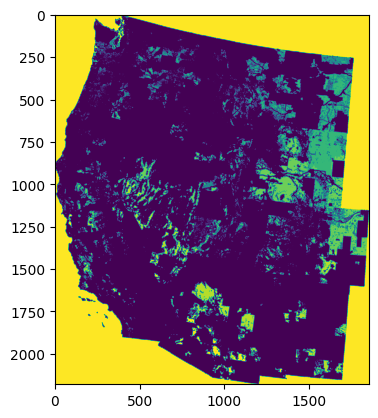

arizona total_generation: 1644422916 needed_generation: 27293103 difference: 1543632266 total land: 577
california total_generation: 675742069 needed_generation: 154566960 difference: 574951419 total land: 3592
colorado total_generation: 1969794594 needed_generation: 69555893 difference: 1869003944 total land: 1655
idaho total_generation: 281679696 needed_generation: 12397083 difference: 180889046 total land: 337
montana total_generation: 2078303960 needed_generation: 128392581 difference: 1977513310 total land: 4072
new_mexico total_generation: 636526991 needed_generation: 46859963 difference: 535736341 total land: 1004
nevada total_generation: 1564069030 needed_generation: 9602251 difference: 1463278380 total land: 203
oregon total_generation: 224921029 needed_generation: 33197367 difference: 124130379 total land: 903
utah total_generation: 441619365 needed_generation: 32291576 difference: 340828715 total land: 768
washington total_generation: 340633508 needed_generation: 30759188 di

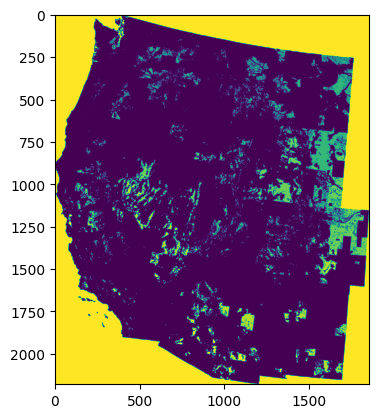

arizona total_generation: 1057340854 needed_generation: 27293103 difference: 956550204 total land: 577
california total_generation: 498378494 needed_generation: 154566960 difference: 397587844 total land: 3592
colorado total_generation: 1880873817 needed_generation: 69555893 difference: 1780083167 total land: 1655
idaho total_generation: 256036221 needed_generation: 12397083 difference: 155245571 total land: 337
montana total_generation: 1146107705 needed_generation: 128392581 difference: 1045317055 total land: 4072
new_mexico total_generation: 621847032 needed_generation: 46859963 difference: 521056382 total land: 1010
nevada total_generation: 1393228018 needed_generation: 9602251 difference: 1292437368 total land: 203
oregon total_generation: 163584088 needed_generation: 33197367 difference: 62793438 total land: 903
utah total_generation: 262363485 needed_generation: 32291576 difference: 161572835 total land: 768
washington total_generation: 274160963 needed_generation: 30759188 diff

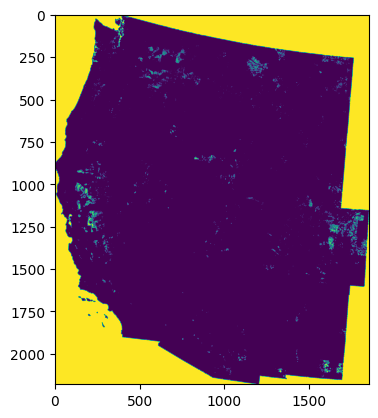

arizona total_generation: 23861812 needed_generation: 27293103 difference: -76928838 total land: 514
california total_generation: 345671283 needed_generation: 154566960 difference: 244880633 total land: 3781
colorado total_generation: 350264749 needed_generation: 69555893 difference: 249474099 total land: 1859
idaho total_generation: 57536650 needed_generation: 12397083 difference: -43254000 total land: 337
montana total_generation: 167893305 needed_generation: 128392581 difference: 67102655 total land: 4072
new_mexico total_generation: 108588700 needed_generation: 46859963 difference: 7798050 total land: 1082
nevada total_generation: 13607784 needed_generation: 9602251 difference: -87182866 total land: 245
oregon total_generation: 37122385 needed_generation: 33197367 difference: -63668265 total land: 1041
utah total_generation: 23404914 needed_generation: 32291576 difference: -77385736 total land: 635
washington total_generation: 145644779 needed_generation: 30759188 difference: 44854

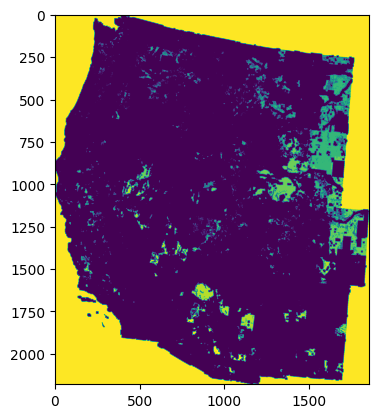

arizona total_generation: 1009819688 needed_generation: 27293103 difference: 909029038 total land: 577
california total_generation: 232256998 needed_generation: 154566960 difference: 131466348 total land: 3702
colorado total_generation: 1341335963 needed_generation: 69555893 difference: 1240545313 total land: 1655
idaho total_generation: 82554012 needed_generation: 12397083 difference: -18236638 total land: 337
montana total_generation: 1318891660 needed_generation: 128392581 difference: 1218101010 total land: 4072
new_mexico total_generation: 328683753 needed_generation: 46859963 difference: 227893103 total land: 1089
nevada total_generation: 625268902 needed_generation: 9602251 difference: 524478252 total land: 203
oregon total_generation: 73172529 needed_generation: 33197367 difference: -27618121 total land: 979
utah total_generation: 189310545 needed_generation: 32291576 difference: 88519895 total land: 768
washington total_generation: 131632835 needed_generation: 30759188 differen

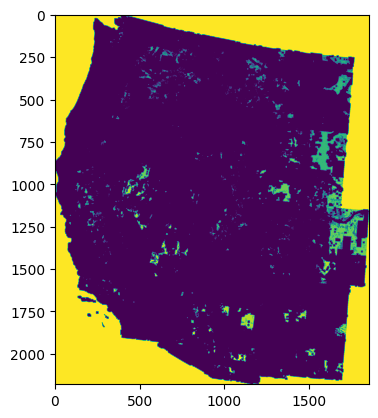

arizona total_generation: 453805427 needed_generation: 27293103 difference: 353014777 total land: 577
california total_generation: 143152058 needed_generation: 154566960 difference: 42361408 total land: 3645
colorado total_generation: 1248457364 needed_generation: 69555893 difference: 1147666714 total land: 1655
idaho total_generation: 52579814 needed_generation: 12397083 difference: -48210836 total land: 339
montana total_generation: 517455200 needed_generation: 128392581 difference: 416664550 total land: 4072
new_mexico total_generation: 314518896 needed_generation: 46859963 difference: 213728246 total land: 1097
nevada total_generation: 512822038 needed_generation: 9602251 difference: 412031388 total land: 203
oregon total_generation: 51680895 needed_generation: 33197367 difference: -49109755 total land: 1012
utah total_generation: 62635689 needed_generation: 32291576 difference: -38154961 total land: 865
washington total_generation: 115008200 needed_generation: 30759188 difference:

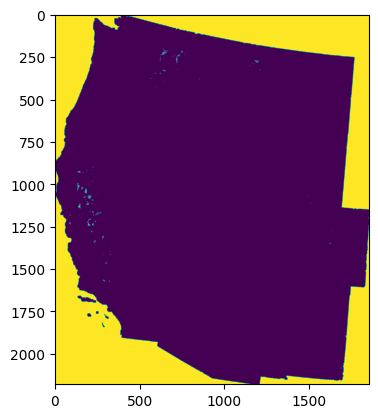

arizona total_generation: 0 needed_generation: 27293103 difference: -100790650 total land: 0
california total_generation: 73158264 needed_generation: 154566960 difference: -27632386 total land: 1910
colorado total_generation: 1066968 needed_generation: 69555893 difference: -99723682 total land: 29
idaho total_generation: 215490 needed_generation: 12397083 difference: -100575160 total land: 7
montana total_generation: 5292625 needed_generation: 128392581 difference: -95498025 total land: 168
new_mexico total_generation: 867235 needed_generation: 46859963 difference: -99923415 total land: 20
nevada total_generation: 0 needed_generation: 9602251 difference: -100790650 total land: 0
oregon total_generation: 157675 needed_generation: 33197367 difference: -100632975 total land: 5
utah total_generation: 0 needed_generation: 32291576 difference: -100790650 total land: 0
washington total_generation: 24649860 needed_generation: 30759188 difference: -76140790 total land: 782
wyoming total_generat

In [144]:
tech_type = 'Solar PV'
solar_power_density = 30

# open wind potential raster file
solar_array = rasterio.open(solar_potential_path).read(1)

# for each analysis combination
for analysis_name in exclusion_combos:

    # combine the wind potential raster with the additional exclusions
    exclusion_list = exclusion_combos[analysis_name]
    print(analysis_name)
    
    if exclusion_list is None:
        
        final_raster = np.where(solar_array==1, 1, 0)
        
    else:
        for exc in exclusion_list:
            exclusion_array = rasterio.open(exc).read(1)
            
            exclusion_array = np.where(exclusion_array==1, 1, 0)
            
            if exclusion_list[0] == exc:
                combined_exclusion = exclusion_array
            else:
                combined_exclusion += exclusion_array
                
        combined_exclusion = np.where(combined_exclusion >=1, 0, 1)
        #show(solar_array)
        final_raster = solar_array*combined_exclusion

        show(final_raster)

    # loop through each state
    for state in output_dict:
        state_id = state_settings_dict[state]['id_no']
        state_array = np.where(conus_array==state_id, 1, 0)
        state_array = np.where(state_array==0, 0, 1)
        
        state_raster = state_array*final_raster
    
        # calculate total potential generation
        state_raster = ((state_raster/100) * solar_power_density * hours_per_year).astype(int)

        total_generation = state_raster.sum()

        # calculate the amount of land required to meet generation goals
        state_raster_list = state_raster.flatten()
        state_raster_list = [i for i in state_raster_list if i != 0]
        state_raster_list.sort()
        
        target_generation = net_zero_dict[state]['clean_grid_mwh']
        total_km = 0
        total_gen = 0
        for i in state_raster_list[::-1]:
            if total_gen < target_generation:
                if total_km == len(state_raster_list):
                    total_km = len(state_raster_list)
                else:
                    total_km += 1
                    total_gen += i
            else:
                pass
                
        
        print(state, f'total_generation: {total_generation}', 
                      f'needed_generation: {target_generation}', 
                      f'difference: {total_generation-needed_generation}', 
                      f'total land: {total_km}')
        #show(state_raster)
        output_dict[state][tech_type][analysis_name]['total_gen'] = total_generation
        output_dict[state][tech_type][analysis_name]['total_km'] = total_km

In [145]:
# convert dictionary to dataframe
result_df = pd.DataFrame.from_dict({(i,j,k): output_dict[i][j][k] 
                           for i in output_dict.keys() 
                           for j in output_dict[i].keys()
                           for k in output_dict[i][j].keys()},
                       orient='index')

result_df = result_df.reset_index().rename(columns={'level_0':'region_name', 'level_1':'tech_name_simple', 'level_2':'analysis'})
result_df

#combined with required generation by scenario
# output_df = pd.merge(result_df, combo_df_final, how='left', on=['region_name', 'tech_name_simple'])
# output_df

,region_name,tech_name_simple,analysis,total_gen,total_km
0,arizona,Wind,baseline,1000129764,620
1,arizona,Wind,dac,563215409,656
2,arizona,Wind,farmland,1708750945,612
3,arizona,Wind,env_1,1712372414,612
4,arizona,Wind,env_1_1km,1565291635,623
...,...,...,...,...,...
523,wyoming,Solar PV,dac_farm_env2_1km,2540440628,2740
524,wyoming,Solar PV,dac_farm_env3_1km,37411612,1102
525,wyoming,Solar PV,dac_farm_env1_5km,2711894591,2740
526,wyoming,Solar PV,dac_farm_env2_5km,1287767194,2740


In [35]:


# Create combined environmental
# get the parent directory path to where this notebook is currently stored
root_dir = '/Users/mong275/repos/gridcerf'

# data directory in repository
data_dir = os.path.join(root_dir, "data")

# GRIDCERF data directory from downloaded archive
gridcerf_dir = os.path.join(data_dir, "gridcerf")

# common exclusion layers
common_dir = os.path.join(gridcerf_dir, 'common')

# directory to write compiled layers to
compiled_dir = os.path.join(gridcerf_dir, 'compiled')

# directory containing technology specific layers
tech_dir = os.path.join(gridcerf_dir, 'technology_specific')

# directory containing reference data
reference_dir = os.path.join(gridcerf_dir, 'reference')

# a file of technologies and their levels with the raster name
cerf_technologies_file = os.path.join(reference_dir, "gridcerf_technologies.txt")

siting_mask_file_0 = os.path.join(reference_dir, "gridcerf_sitingmask_0-value.tif") 
siting_mask_file_1 = os.path.join(reference_dir, "gridcerf_sitingmask.tif")
land_mask_file_0 = os.path.join(reference_dir, "gridcerf_landmask_0-land.tif")

# technology layer list
layer_list_file = os.path.join(reference_dir, 'technology_layer_list.csv')

# compiled layer output dir
compiled_output_dir =os.path.join(compiled_dir, 'compiled_technology_layers')

# create a list of ssp scenarios to create suitability data for
ssp_list = ['ssp2', 'ssp3', 'ssp5']

# create a list of technology groupings to create composite suitability layers for
tech_group_list =  ['geothermal', 'gas', 'nuclear',  'solar', 'solar_csp', 'wind', 'wind_offshore', 'biomass', 'coal', 'refinedliquids']

# create a list of years to create composite suitability layers for
year_list = list(range(2020, 2100+1, 5))


def compile_layer(target_layer, compile_list, siting_mask_file_0, siting_mask_file_1, output_dir):
    """Compile a suitability layer."""
    
    land_mask_0 = rasterio.open(siting_mask_file_0).read(1)

    with rasterio.open(siting_mask_file_1) as template:

        metadata = template.meta.copy()

        land_mask_1 = template.read(1)

        for index, i in enumerate(compile_list):

            with rasterio.open(i) as src:

                if index == 0:
                    arr = src.read(1)
                else:
                    arr += src.read(1)
                # print(i)
                # show(arr)

            # adjust to binary suitability with nodata set to 3 for uint8 storage 
            arr = np.where(arr == 0, 0, 1)

            # apply land mask
            arr *= land_mask_1
            
            arr += land_mask_0

            # write compiled file
            output_file = os.path.join(output_dir, target_layer)
            with rasterio.open(output_file, 'w', **metadata) as dest:

                dest.write(arr.astype(np.int16), 1)
                
                                       
    return output_file


# get a list of all common layers
env_files = glob.glob(os.path.join(common_dir, "*.tif"))

env_files.remove("/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_dod_military_installations_conus.tif")
env_files.remove("/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_epa_class1_airsheds_conus.tif")

#for file in os.listdir(common_dir):
    #print(file)

# for file in sorted(os.listdir(tech_dir)):
#     print(file)
# tech_list = ['gridcerf_blm_combined_wind_exclusion_areas.tif',
#              'gridcerf_blm_combined_solar_exclusions.tif']
# for file in tech_list:
#     file_path = os.path.join(tech_dir, file)
#     env_files.append(file_path)

output_dir = '/Users/mong275/repos/mongird-etal_2024_tbd/data/input_data/raster_data/original_raster/suitability_2.0'

offshore_file = os.path.join(output_dir, 'gridcerf_2.0_combined_offshore_environment.tif')
env_files.append(offshore_file)

target_layer = 'gridcerf_2.0_combined_environment.tif'

compile_layer(target_layer=target_layer, compile_list=env_files, siting_mask_file_0=siting_mask_file_0, 
              siting_mask_file_1=siting_mask_file_1, output_dir=output_dir)


'/Users/mong275/repos/mongird-etal_2024_tbd/data/input_data/raster_data/original_raster/suitability_2.0/gridcerf_2.0_combined_environment.tif'

In [29]:
env_files = glob.glob(os.path.join(common_dir, "*.tif"))
for f in env_files:
    print(f)

env_files.remove("/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_dod_military_installations_conus.tif")
env_files.remove("/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_epa_class1_airsheds_conus.tif")
env_files

/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_dod_military_installations_conus.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_usfs_national_wild_scenic_river_system_conus.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_blm_nlcs_national_monument_conus.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_blm_nlcs_wilderness_conus.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_usfws_critical_habitat_conus.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_wdpa_tnc_managed_lands_conus.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_blm_historic_parks.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_nps_historic_trails_conus.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_usfs_wilderness_areas_conus.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_usfs_national_designated_areas_conus.tif
/Users/mong275/repos/gridcerf/data/gridcerf/common/grid

['/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_usfs_national_wild_scenic_river_system_conus.tif',
 '/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_blm_nlcs_national_monument_conus.tif',
 '/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_blm_nlcs_wilderness_conus.tif',
 '/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_usfws_critical_habitat_conus.tif',
 '/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_wdpa_tnc_managed_lands_conus.tif',
 '/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_blm_historic_parks.tif',
 '/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_nps_historic_trails_conus.tif',
 '/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_usfs_wilderness_areas_conus.tif',
 '/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_usfs_national_designated_areas_conus.tif',
 '/Users/mong275/repos/gridcerf/data/gridcerf/common/gridcerf_usfws_special_designation_conus.tif',
 '/Users/mong275

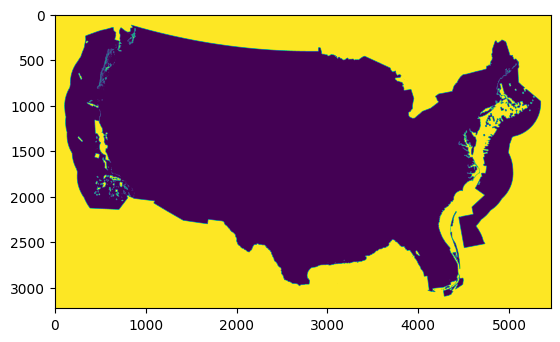

In [24]:
from rasterio.plot import show
offshore_raster = ['gridcerf_noaa_habitats_of_particular_concern.tif',
             'gridcerf_noaa_marine_sanctuaries.tif',
             'gridcerf_offshore_areas_withdrawn_from_leasing.tif']

for r in offshore_raster:
    file_path = os.path.join(tech_dir, r)
    array = rasterio.open(file_path).read(1)
    conus = rasterio.open(land_mask_file_0).read(1)
    array = array*conus
    if offshore_raster[0] == r:
        combo_offshore = array
    else:
        combo_offshore = combo_offshore + array
combo_offshore = np.where(combo_offshore>=1, 1, 0)
show(combo_offshore)

with rasterio.open(siting_mask_file_1) as template:

    metadata = template.meta.copy()

target_layer = 'gridcerf_2.0_combined_offshore_environment.tif'
output_dir = '/Users/mong275/repos/mongird-etal_2024_tbd/data/input_data/raster_data/original_raster/suitability_2.0'

# write compiled file
output_file = os.path.join(output_dir, target_layer)
with rasterio.open(output_file, 'w', **metadata) as dest:
    dest.write(combo_offshore.astype(np.int16), 1)


## Imports

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import shapely
from shapely import Point

import rasterio
from rasterio.plot import show

import os
from pathlib import Path

## File Paths

In [249]:
year = 2050

# data dir
data_dir = os.path.join(os.path.dirname(os.getcwd()), 'data', 'input_data')

# output data dir
output_dir = os.path.join(os.path.dirname(os.getcwd()), 'data', 'output_data')

# raster dir
raster_dir = os.path.join(data_dir, 'raster_data')

# state raster path
state_raster_path = os.path.join(raster_dir, 'state_raster', 'state_raster.tif')

# suitability raster dir
suit_dir = os.path.join(raster_dir, 'suitability')

# dac raster path
dac_raster_path = os.path.join(raster_dir, 'disadvantaged_communities','all_areas', 'gridcerf_usceq_justice40_vulnerable_communities.tif')

# farmland raster path
farm_raster_path = os.path.join(raster_dir, 'important_farmland', 'all_areas', 'gridcerf_usda_nrsc_combined_farmland_of_importance.tif')

# env raster path
env_1km_raster_path = os.path.join(raster_dir, 'environmental', 'all_areas', 'west_analysis_combined_environment_1buff.tif')
env_5km_raster_path = os.path.join(raster_dir, 'environmental',  'all_areas','west_analysis_combined_environment_5buff.tif')
env_10km_raster_path = os.path.join(raster_dir, 'environmental',  'all_areas', 'west_analysis_combined_environment_10buff.tif')

# infrastructure siting output csv
infrastucture_path = os.path.join(data_dir,  'infrastructure_data_csv', f'infrastructure_data_{year}.csv')

# wind no potential layer
wind_no_potential_path = os.path.join(raster_dir, 'suitability', 'wind_no_potential', 'all_areas', 'gridcerf_wind_onshore_no_potential_100m.tif')

### Collect GCAM Generation in 2050

In [17]:
%%time
gcamextractor_data_path = '/Volumes/godeeep/CERF/data/gcam_data/godeeep_gcam_to_cerf_ira_ccs_climate.csv'


gcam = pd.read_csv(gcamextractor_data_path)
df = gcam.copy() 

<timed exec>:4: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.


CPU times: user 2.89 s, sys: 675 ms, total: 3.56 s
Wall time: 6min 23s


In [18]:
state_dict = {'AZ':'arizona', 'CA':'california', 'CO':'colorado', 'ID':'idaho', 'MT':'montana', 
              'NM': 'new_mexico', 'NV':'nevada', 'OR':'oregon', 'UT':'utah', 'WA':'washington', 'WY':'wyoming'}

pd.set_option('display.float_format', lambda x: '%.3f' % x)
df = gcam.copy() 
wecc_list = ['CA', 'OR', 'WA', 'MT', 'CO', 'ID', 'UT', 'NV', 'AZ', 'NM', 'WY']
df = df[df.x == 2050]
df = df[df.subRegion.isin(wecc_list)]
df = df[df.scenario == 'net_zero_ira_ccs_climate']
df = df[df.param.isin(['elec_cap_usa_GW', 'elec_capacity_factor_usa_in'])]
df = df[['subRegion', 'param', 'class2', 'vintage', 'units', 'value']]
df['value'] = np.where(df['units'] == 'GW', df['value']*1000, df['value'])
pv_df = df[df.class2.str.contains('PV')].copy()
pv_df['class2'] ='Solar PV'
wind_df = df[df.class2.str.contains('wind')].copy()
wind_df['class2'] = 'Wind'
wind_df = wind_df[~wind_df.class2.str.contains('offshore')]

combo_df = pd.concat([wind_df, pv_df])

combo_df_cap = combo_df[combo_df.param == 'elec_cap_usa_GW']
combo_df_cf = combo_df[combo_df.param == 'elec_capacity_factor_usa_in']

combo_df_cap = pd.pivot_table(combo_df_cap, values='value', index=['subRegion', 'class2'], columns=['param'], aggfunc=np.sum).reset_index().rename_axis(None, axis=1)
combo_df_cf = pd.pivot_table(combo_df_cf, values='value', index=['subRegion', 'class2'], columns=['param'], aggfunc=np.mean).reset_index().rename_axis(None, axis=1)

combo_df_final = pd.merge(combo_df_cap, combo_df_cf, how='left', on=['subRegion', 'class2'])
combo_df_final['generation_mwh'] = (combo_df_final['elec_cap_usa_GW'] * 8760 * combo_df_final['elec_capacity_factor_usa_in']).astype(int)
combo_df_final['subRegion'] = combo_df_final['subRegion'].map(state_dict)
combo_df_final = combo_df_final.rename(columns={'subRegion': 'region_name','class2':'tech_name_simple', 'generation_mwh':'clean_grid_mwh'})

combo_df_final = combo_df_final[['region_name', 'tech_name_simple', 'clean_grid_mwh']]


In [21]:
combo_df_wind = combo_df_final[combo_df_final.tech_name_simple == 'Wind'][['region_name', 'clean_grid_mwh']].copy()
net_zero_dict = combo_df_wind.set_index('region_name').to_dict('index')
net_zero_dict

{'arizona': {'clean_grid_mwh': 27293103},
 'california': {'clean_grid_mwh': 154566960},
 'colorado': {'clean_grid_mwh': 69555893},
 'idaho': {'clean_grid_mwh': 12397083},
 'montana': {'clean_grid_mwh': 128392581},
 'new_mexico': {'clean_grid_mwh': 46859963},
 'nevada': {'clean_grid_mwh': 9602251},
 'oregon': {'clean_grid_mwh': 33197367},
 'utah': {'clean_grid_mwh': 32291576},
 'washington': {'clean_grid_mwh': 30759188},
 'wyoming': {'clean_grid_mwh': 100790650}}

In [181]:
# prepare output dictionary to store analysis values
output_dict={
    'arizona': {},
    'california': {},
    'colorado':{},
    'idaho':{},
    'montana':{},
    'new_mexico':{},
    'nevada':{},
    'oregon':{},
    'utah':{},
    'washington':{},
    'wyoming':{}
}
for state in output_dict:
    output_dict[state].update({'Wind':{}, 'Solar PV': {}})
    
    for i in output_dict[state]:
        output_dict[state][i].update({'baseline':[], 'dac': [], 'farmland':[], 
                                      'env_1km':[], 'env_5km':[], 'env_10km':[], 
                                      'dac_farm_env5km':[], 'dac_farm_env10km':[]})


exclusion_combos = {'baseline': [],
                    'dac': [dac_raster_path], 
                    'farmland': [farm_raster_path],
                    'env_1km': [env_1km_raster_path],
                    'env_5km': [env_5km_raster_path],
                    'env_10km': [env_10km_raster_path],
                    'dac_farm_env5km': [dac_raster_path, farm_raster_path, env_5km_raster_path], 
                    'dac_farm_env10km': [dac_raster_path, farm_raster_path, env_10km_raster_path]}


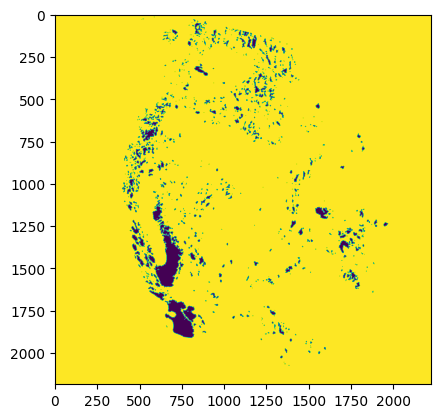

<Axes: >

In [250]:
no_potential_array = rasterio.open(wind_no_potential_path).read(1)
no_potential_array = np.where(no_potential_array == 1, 0, 1)
show(no_potential_array)

0 50
1 45
2 40
3 35
4 30
5 25
6 20
7 15
8 10
9 5


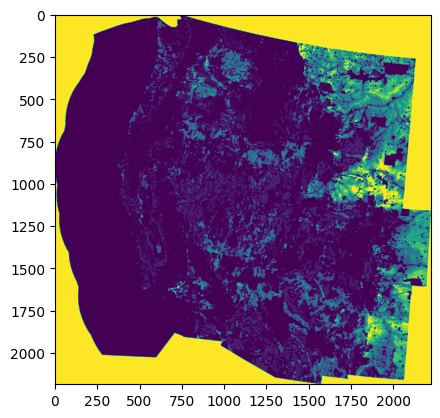

<Axes: >

In [292]:
wind_dir = '/Users/mong275/repos/mongird-etal_2024_tbd/data/input_data/raster_data/suitability/wind_onshore/all_areas'

cf_list = list(range(5, 51, 5))
for cf in cf_list:
    wind_raster = rasterio.open(os.path.join(wind_dir, f'gridcerf_wind_onshore_hubheight100_no-cooling_{cf}cf.tif')).read(1)
    if cf_list[0] == cf:
        sum_raster = wind_raster
    else:
        sum_raster = sum_raster + wind_raster
        
for i in list(range(sum_raster.min(), sum_raster.max(), 1)):
    assigned_cf = 50 - (i*5)
    print(i, assigned_cf)
    sum_raster = np.where(sum_raster == i, assigned_cf, sum_raster)
sum_raster = np.where(sum_raster == 10, 0, sum_raster)
# show(sum_raster)
show(sum_raster)


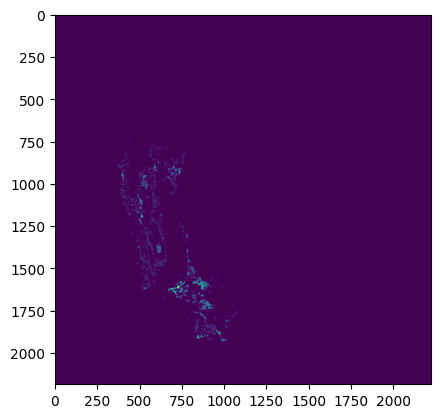

633554737

In [294]:
state_id = state_settings_dict['california']['id_no']
state_array = np.where(conus_array==state_id, 1, 0)
state_array = np.where(state_array==0, 0, 1)

state_final_raster = sum_raster * state_array

state_final_raster = ((state_final_raster/100) * wind_power_density * hours_per_year).astype(int)

show(state_final_raster)
state_final_raster.sum()

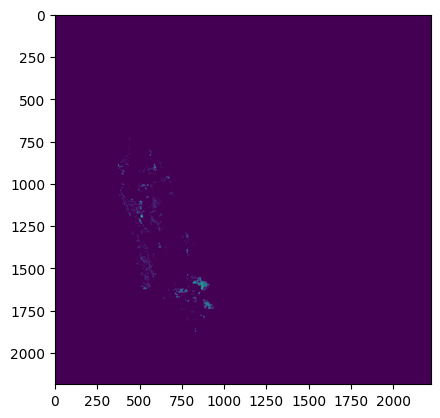

282808979

In [297]:





exc = dac_raster_path
exclusion_array = rasterio.open(exc).read(1)
exclusion_array = np.where(exclusion_array==1, 1, 0)
combined_exclusion = exclusion_array
combined_exclusion = np.where(combined_exclusion >=1, 1, 0)
combined_exclusion = np.where(combined_exclusion ==1, 0, 1)

final_raster = sum_raster*combined_exclusion

state_final_raster = final_raster * state_array
show(state_final_raster)
state_final_raster = ((state_final_raster/100) * wind_power_density * hours_per_year).astype(int)
state_final_raster.sum()

### To DO

* Add a component to the below (or in a new function) that tallies the amount of land required for each combination
* This will require taking the total amount of net zero required and chipping away at the generation you can get in each bin
* 50 squares of high generation
* 100 squares of 2nd highest
* etc.
* 

baseline
0 50
1 45
2 40
3 35
4 30
5 25
6 20
7 15
8 10
9 5
arizona 865362517


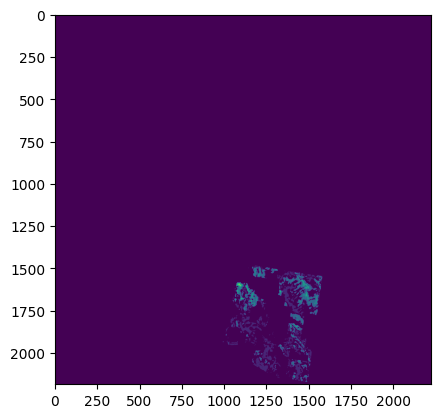

arizona
Wind
baseline
california 350745758


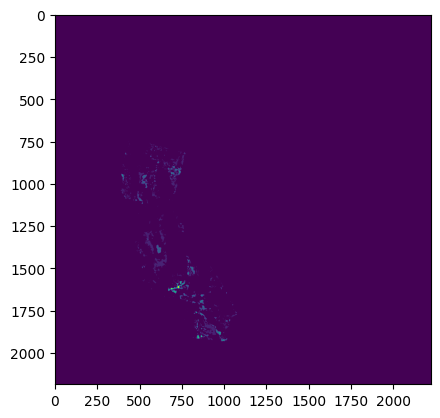

california
Wind
baseline
colorado 1338130343


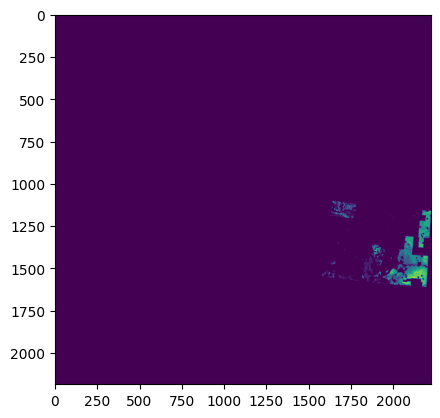

colorado
Wind
baseline
idaho 469110867


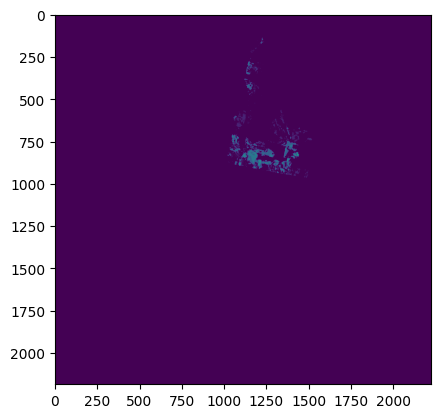

idaho
Wind
baseline
montana 2801800144


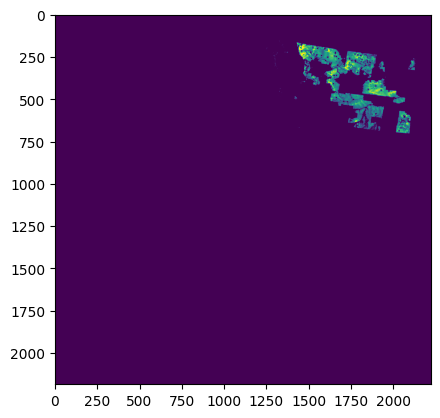

montana
Wind
baseline
new_mexico 3635661257


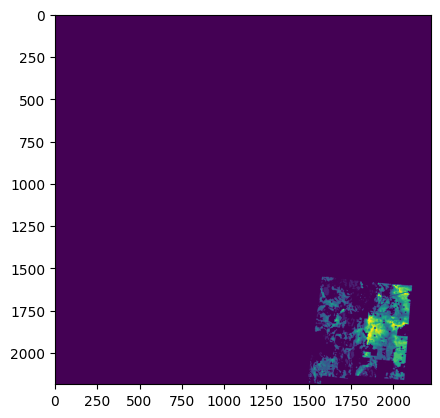

new_mexico
Wind
baseline
nevada 210261045


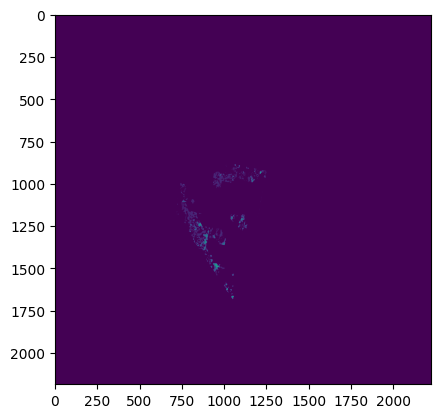

nevada
Wind
baseline
oregon 633699854


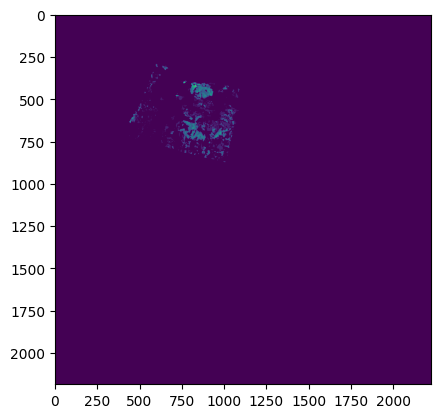

oregon
Wind
baseline
utah 199549952


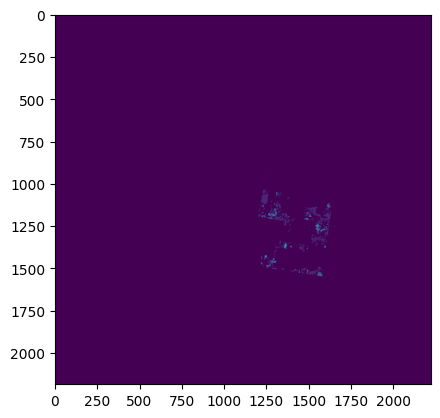

utah
Wind
baseline
washington 362203476


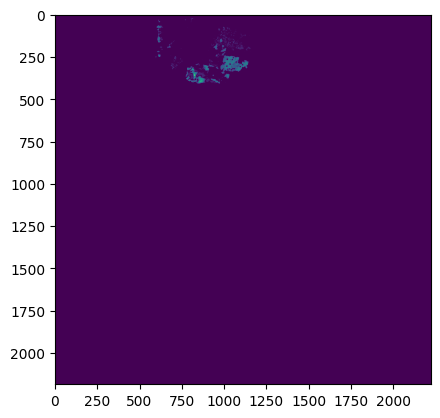

washington
Wind
baseline
wyoming 693672685


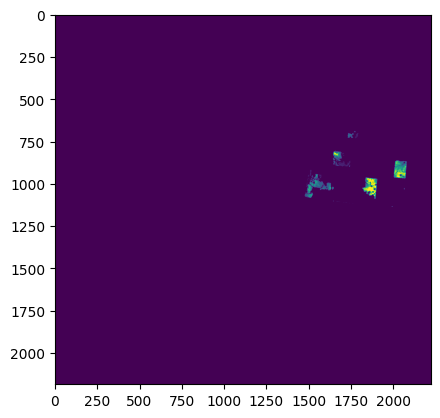

wyoming
Wind
baseline
dac
0 50
1 45
2 40
3 35
4 30
5 25
6 20
7 15
8 10
9 5
arizona 330929749


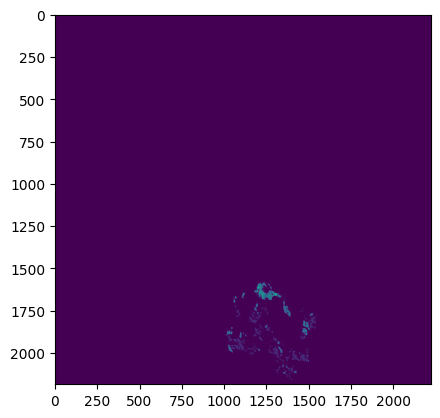

arizona
Wind
dac
california 282808979


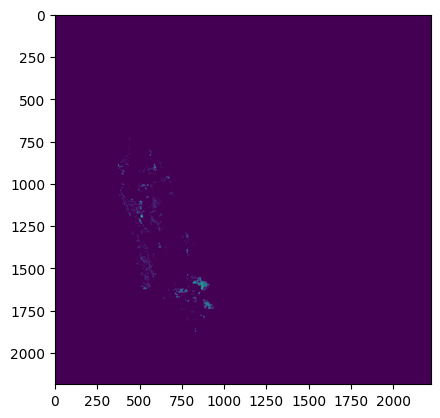

california
Wind
dac
colorado 1124424458


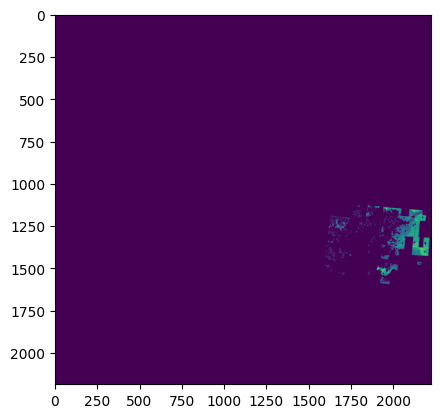

colorado
Wind
dac
idaho 202996902


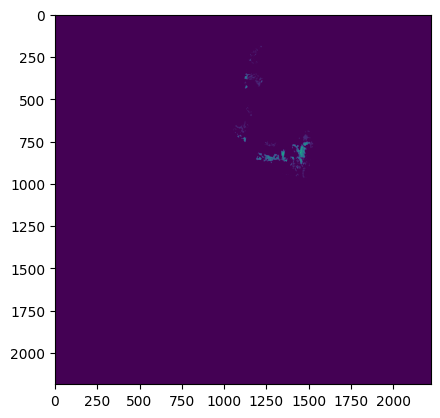

idaho
Wind
dac
montana 2837676836


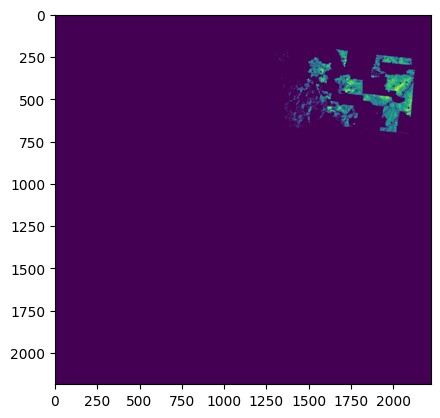

montana
Wind
dac
new_mexico 401366302


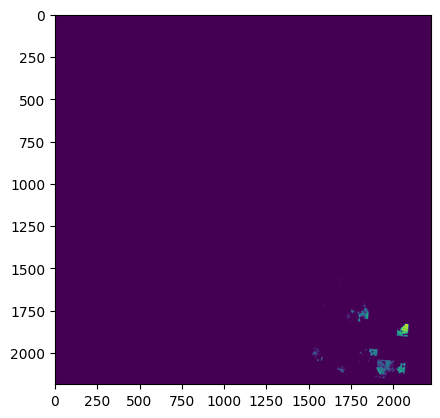

new_mexico
Wind
dac
nevada 704309245


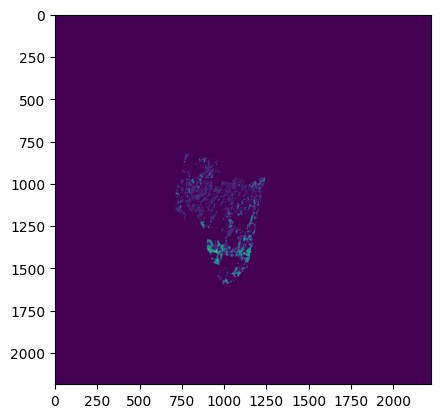

nevada
Wind
dac
oregon 227117060


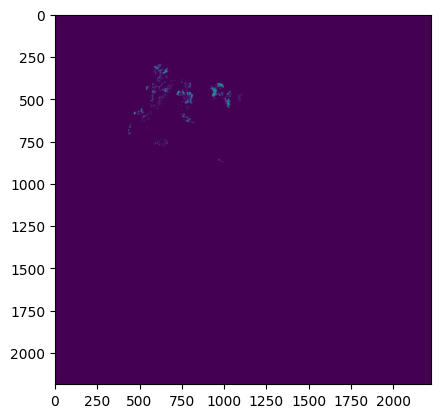

oregon
Wind
dac
utah 373503910


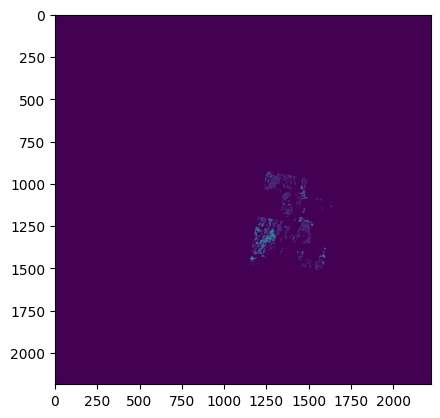

utah
Wind
dac
washington 404160992


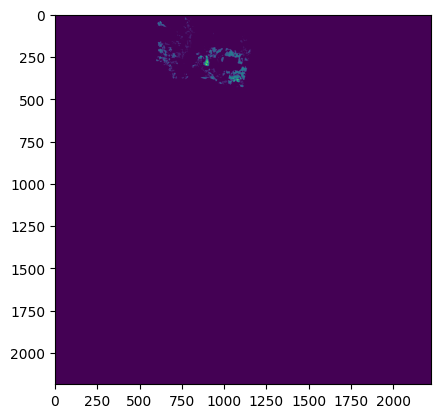

washington
Wind
dac
wyoming 3656990879


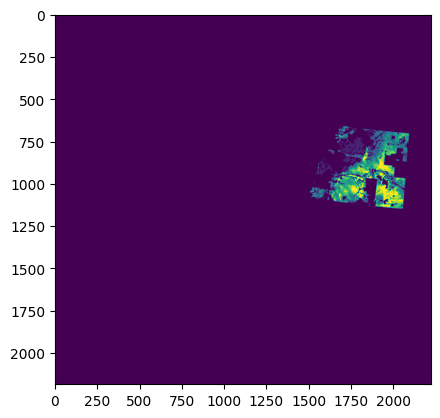

wyoming
Wind
dac
farmland
0 50
1 45
2 40
3 35
4 30
5 25
6 20
7 15
8 10
9 5
arizona 1185806548


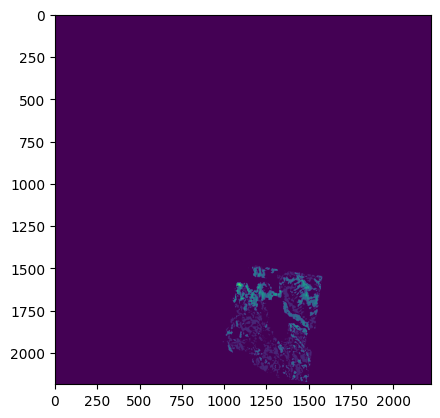

arizona
Wind
farmland
california 587181988


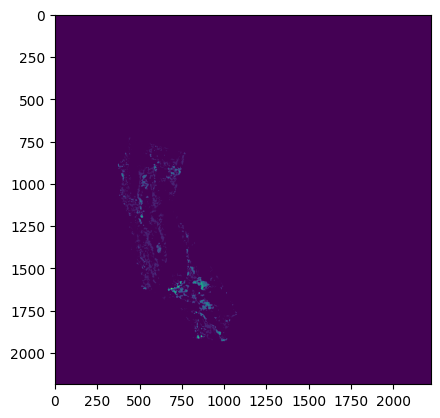

california
Wind
farmland
colorado 2252224461


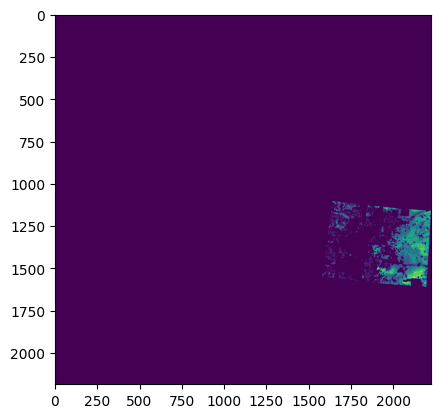

colorado
Wind
farmland
idaho 662631516


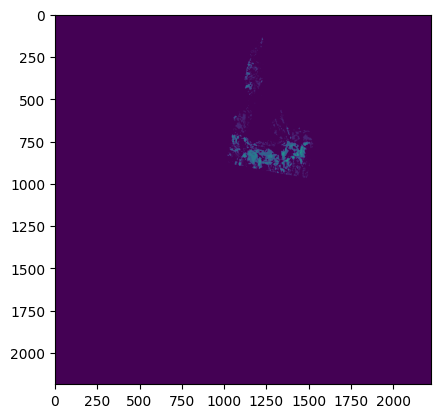

idaho
Wind
farmland
montana 4808716882


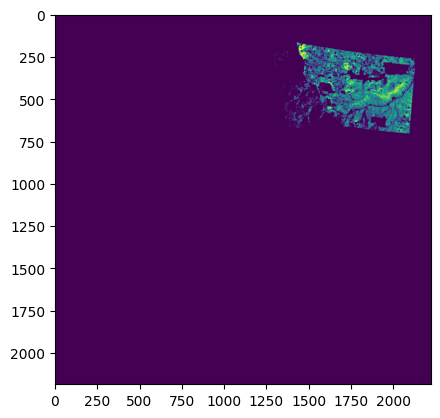

montana
Wind
farmland
new_mexico 3542817217


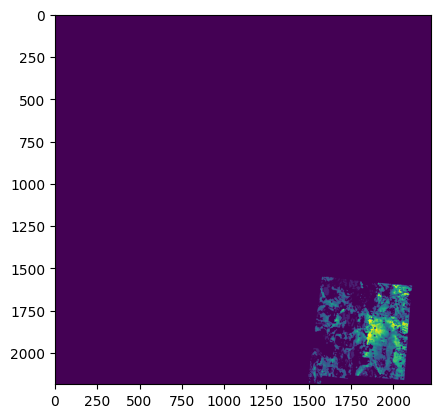

new_mexico
Wind
farmland
nevada 914402101


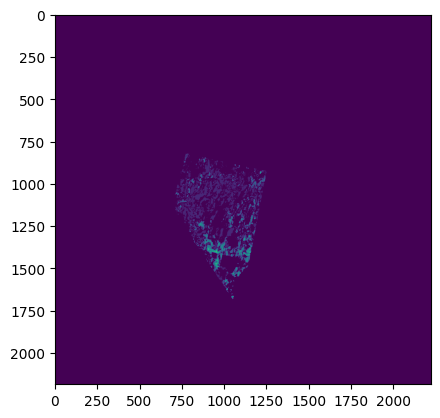

nevada
Wind
farmland
oregon 478042209


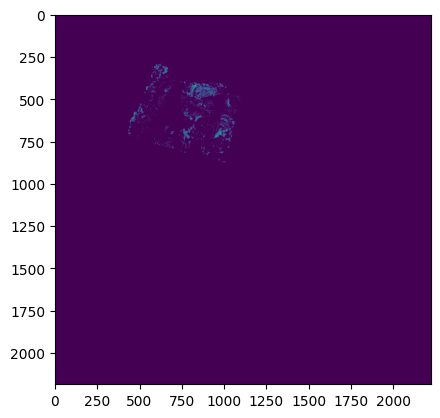

oregon
Wind
farmland
utah 543610316


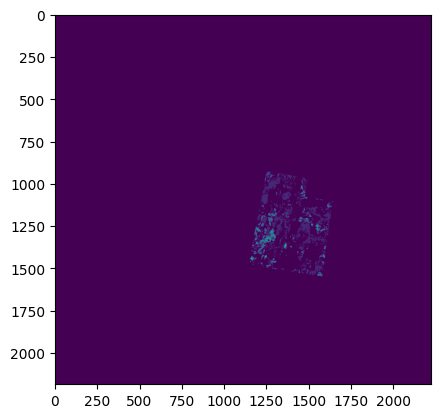

utah
Wind
farmland
washington 424206280


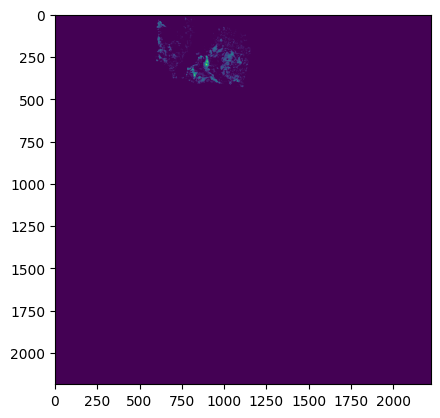

washington
Wind
farmland
wyoming 4316526099


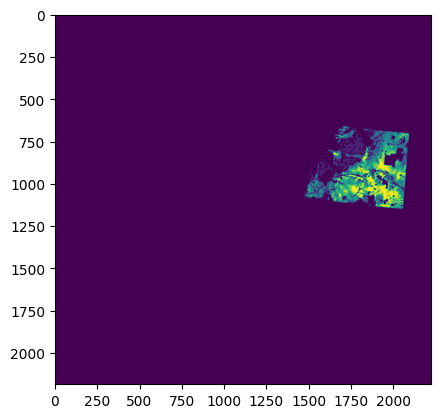

wyoming
Wind
farmland
env_1km
0 50
1 45
2 40
3 35
4 30
5 25
6 20
7 15
8 10
9 5
arizona 1088089583


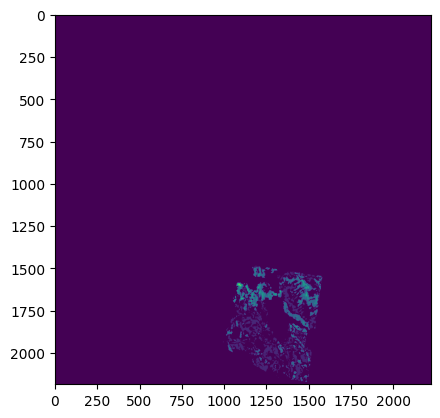

arizona
Wind
env_1km
california 495035803


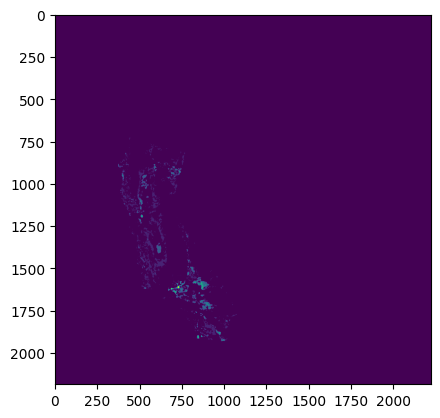

california
Wind
env_1km
colorado 2303164335


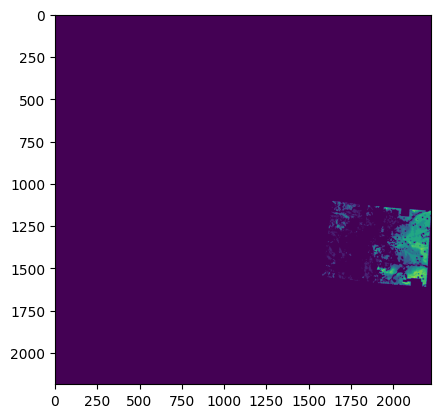

colorado
Wind
env_1km
idaho 584450782


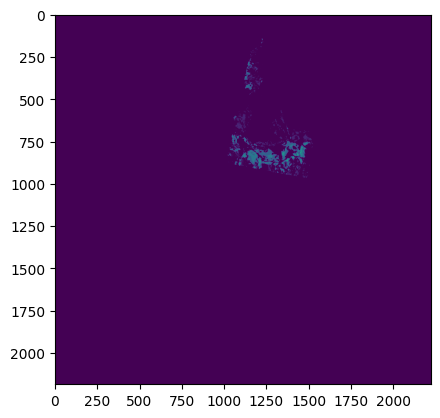

idaho
Wind
env_1km
montana 4820926195


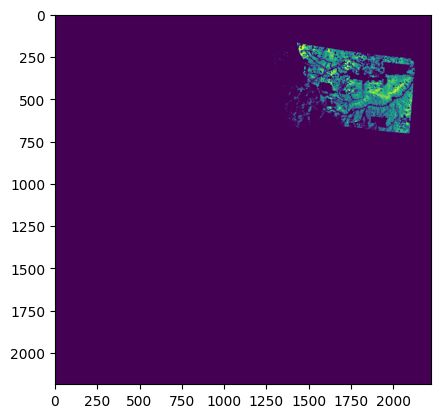

montana
Wind
env_1km
new_mexico 3823754711


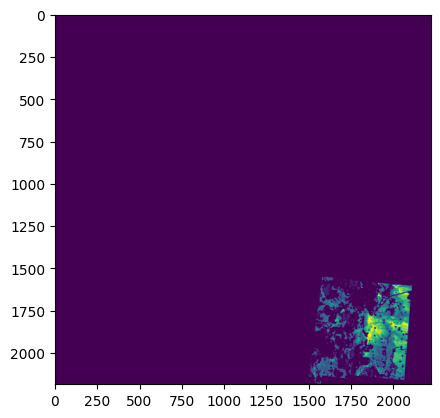

new_mexico
Wind
env_1km
nevada 816237796


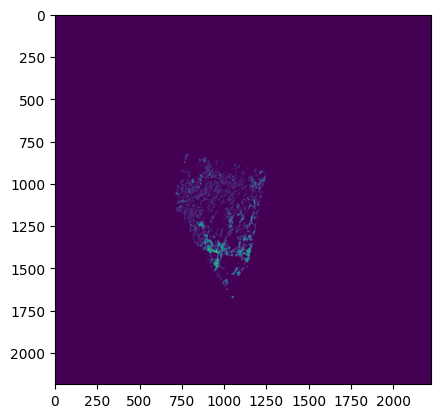

nevada
Wind
env_1km
oregon 720054029


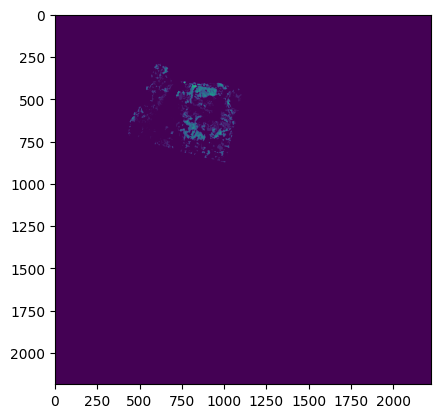

oregon
Wind
env_1km
utah 487514261


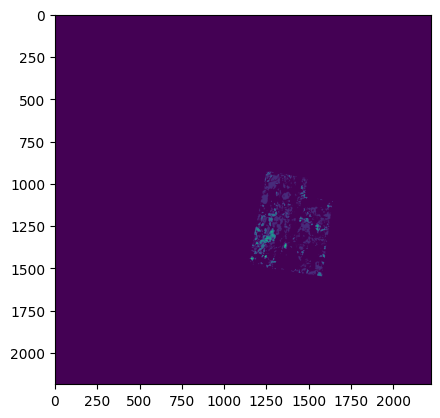

utah
Wind
env_1km
washington 687852238


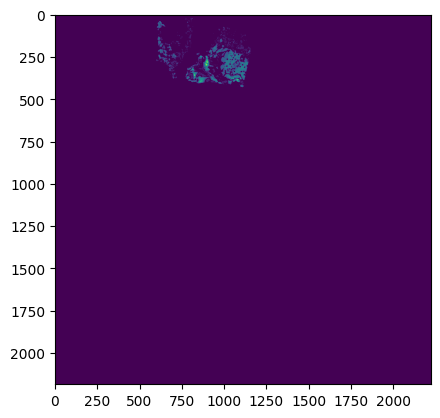

washington
Wind
env_1km
wyoming 3926461774


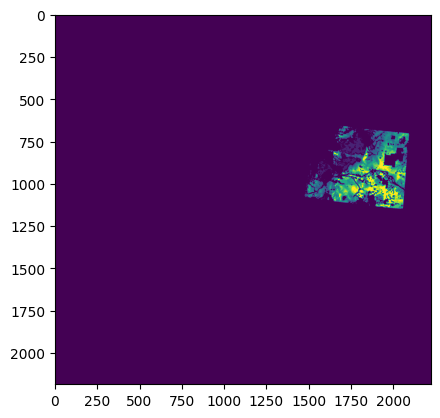

wyoming
Wind
env_1km
env_5km
0 50
1 45
2 40
3 35
4 30
5 25
6 20
7 15
8 10
9 5
arizona 744062111


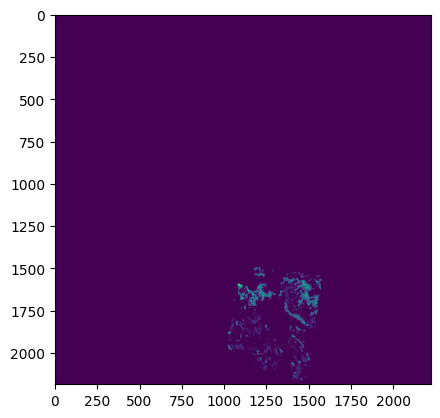

arizona
Wind
env_5km
california 196958715


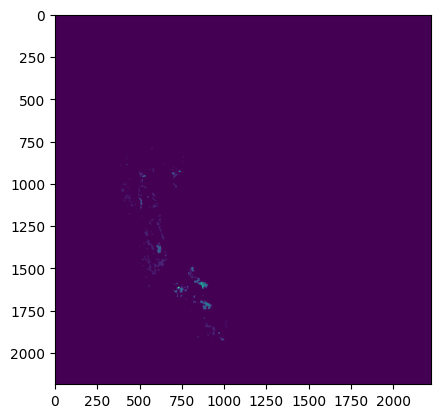

california
Wind
env_5km
colorado 1740934616


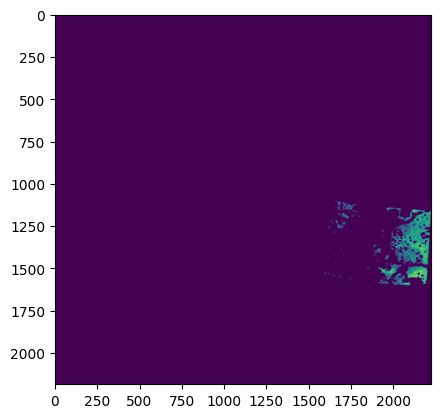

colorado
Wind
env_5km
idaho 307220353


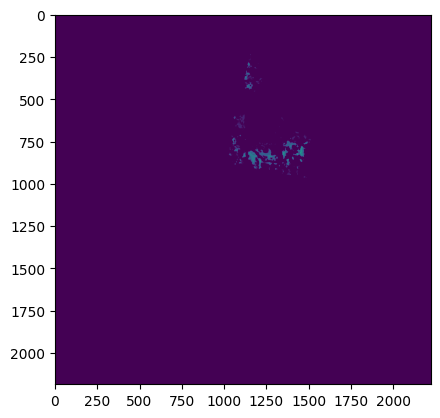

idaho
Wind
env_5km
montana 2141363507


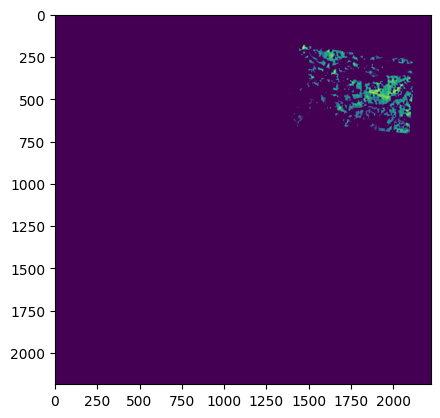

montana
Wind
env_5km
new_mexico 3063918971


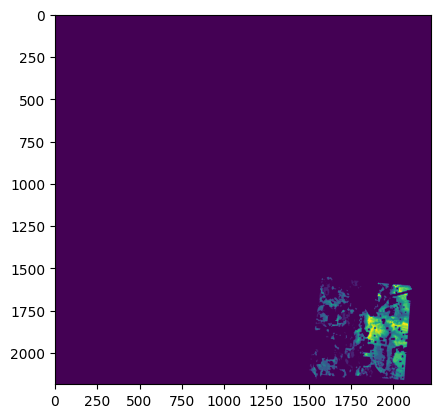

new_mexico
Wind
env_5km
nevada 534170440


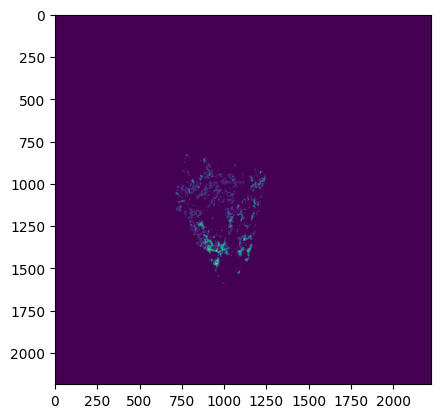

nevada
Wind
env_5km
oregon 385659943


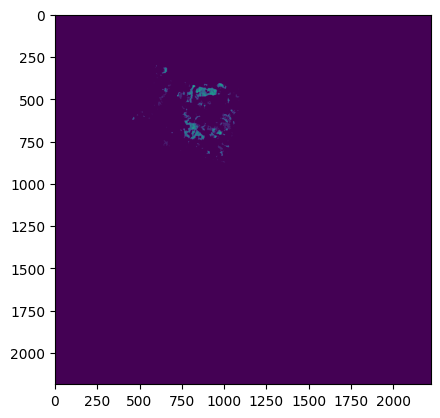

oregon
Wind
env_5km
utah 271686514


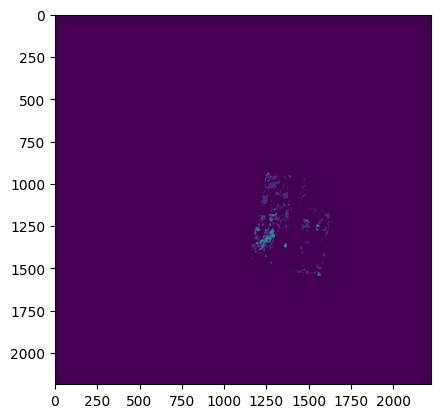

utah
Wind
env_5km
washington 400429550


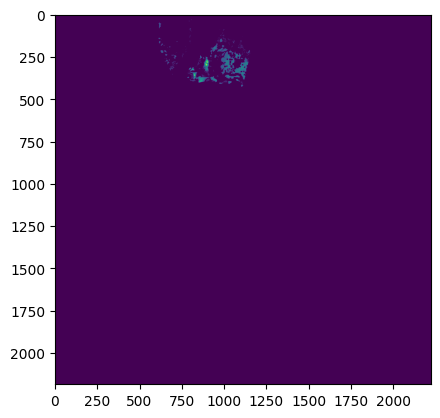

washington
Wind
env_5km
wyoming 2362351827


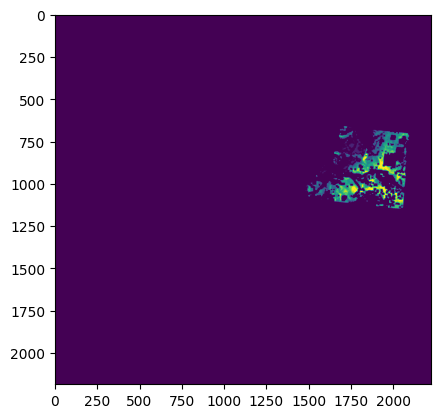

wyoming
Wind
env_5km
env_10km
0 50
1 45
2 40
3 35
4 30
5 25
6 20
7 15
8 10
9 5
arizona 455900438


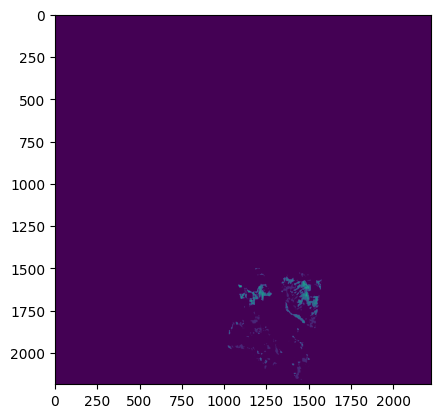

arizona
Wind
env_10km
california 66581056


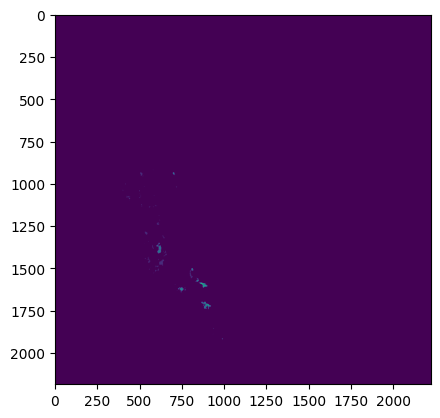

california
Wind
env_10km
colorado 1123939151


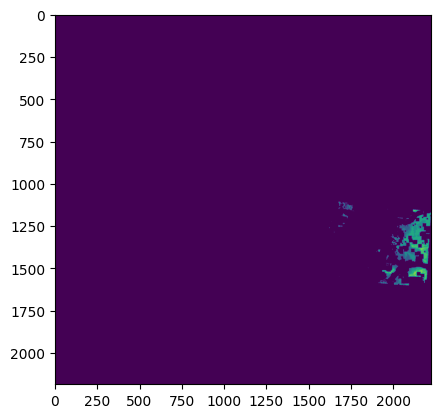

colorado
Wind
env_10km
idaho 102893837


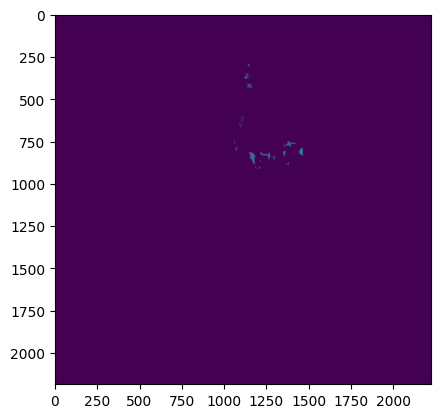

idaho
Wind
env_10km
montana 674558214


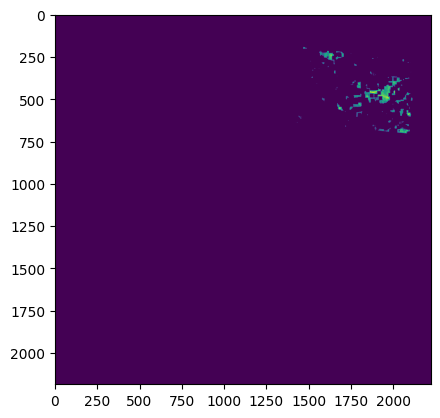

montana
Wind
env_10km
new_mexico 2250240775


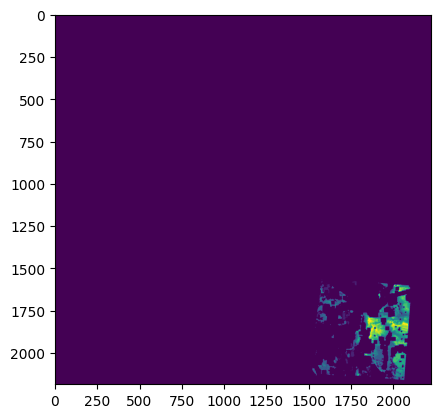

new_mexico
Wind
env_10km
nevada 307474067


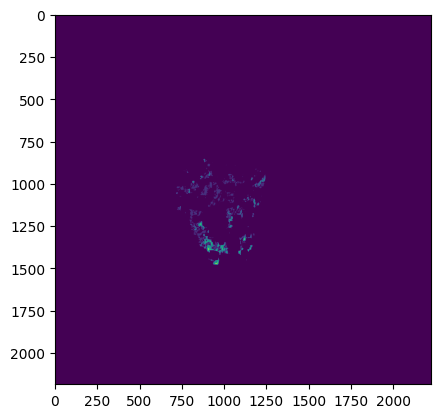

nevada
Wind
env_10km
oregon 164582219


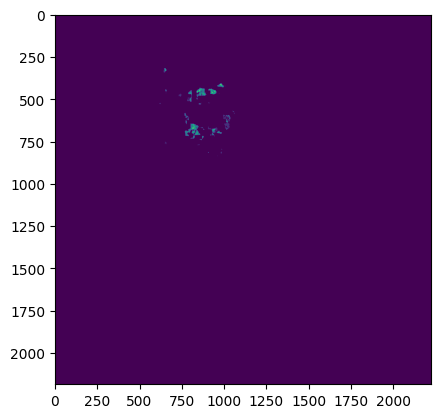

oregon
Wind
env_10km
utah 143458892


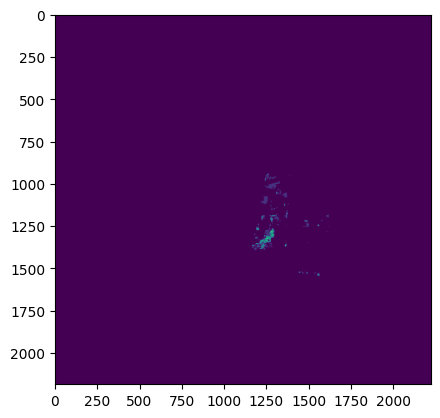

utah
Wind
env_10km
washington 187151513


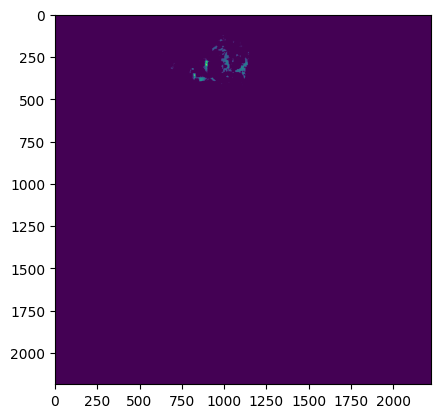

washington
Wind
env_10km
wyoming 1109089813


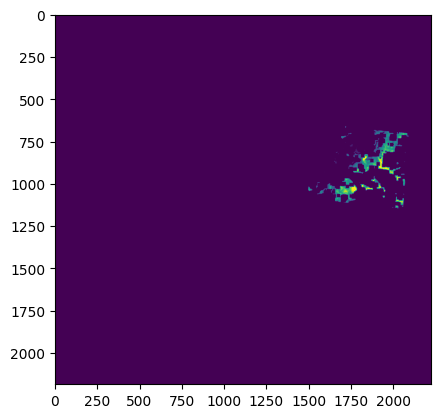

wyoming
Wind
env_10km
dac_farm_env5km
0 50
1 45
2 40
3 35
4 30
5 25
6 20
7 15
8 10
9 5
arizona 190015028


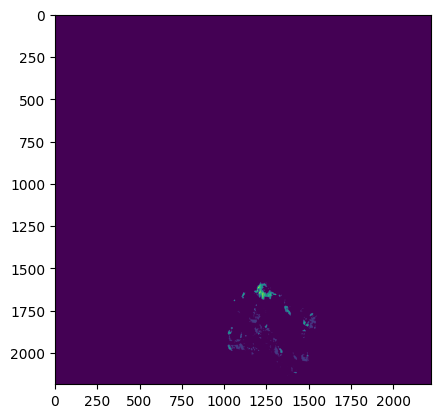

arizona
Wind
dac_farm_env5km
california 96025109


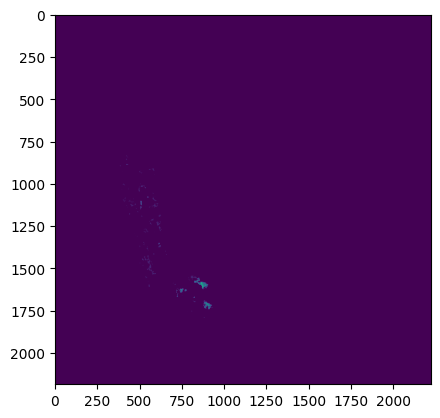

california
Wind
dac_farm_env5km
colorado 727198917


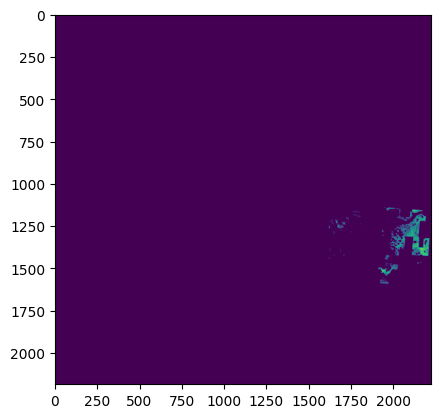

colorado
Wind
dac_farm_env5km
idaho 89517983


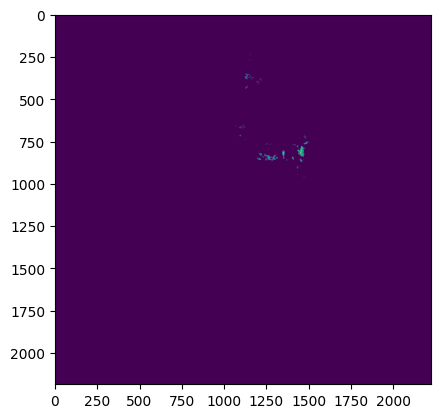

idaho
Wind
dac_farm_env5km
montana 976321937


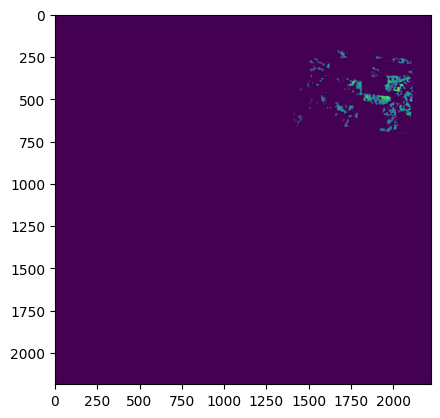

montana
Wind
dac_farm_env5km
new_mexico 268451065


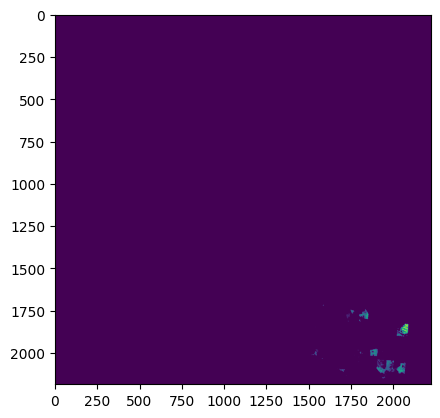

new_mexico
Wind
dac_farm_env5km
nevada 411067668


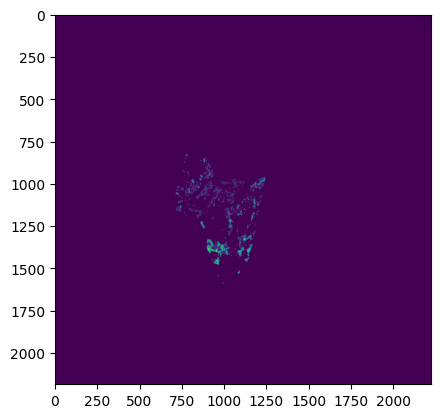

nevada
Wind
dac_farm_env5km
oregon 41647749


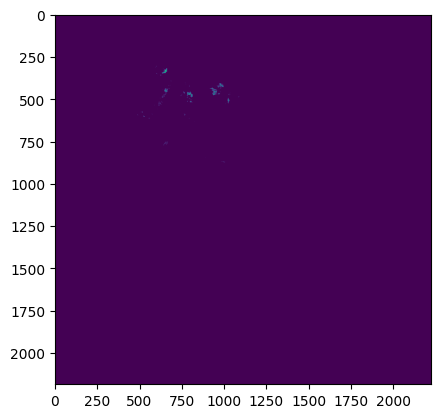

oregon
Wind
dac_farm_env5km
utah 181953018


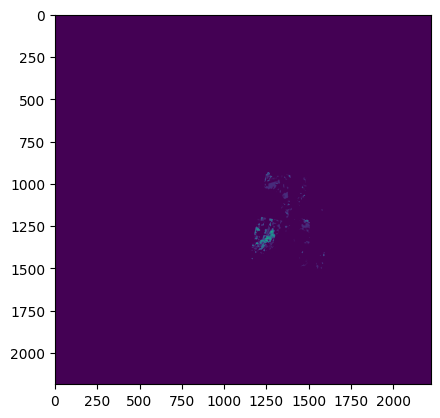

utah
Wind
dac_farm_env5km
washington 92602944


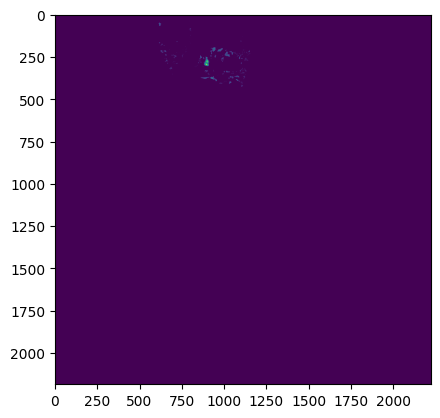

washington
Wind
dac_farm_env5km
wyoming 2016369488


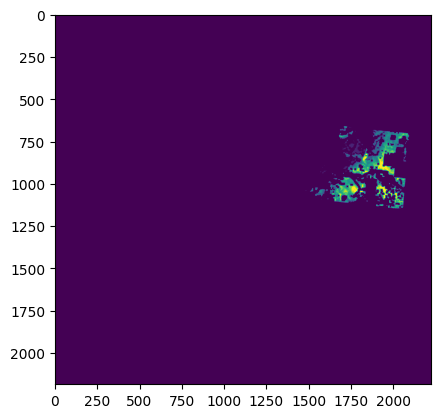

wyoming
Wind
dac_farm_env5km
dac_farm_env10km
0 50
1 45
2 40
3 35
4 30
5 25
6 20
7 15
8 10
9 5
arizona 110798902


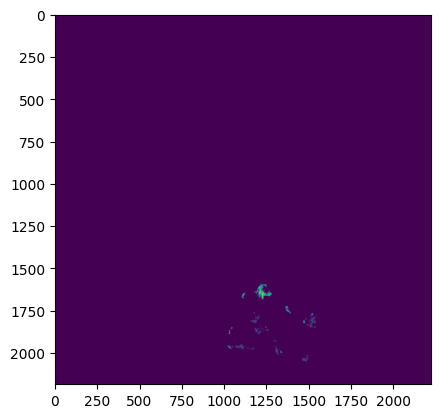

arizona
Wind
dac_farm_env10km
california 37479627


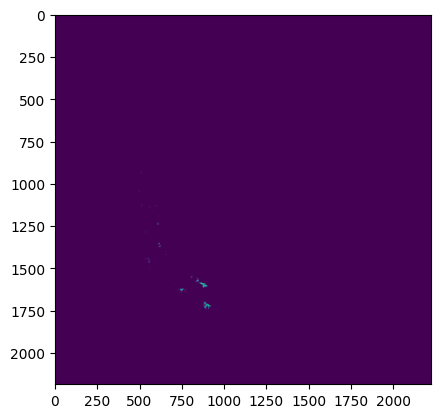

california
Wind
dac_farm_env10km
colorado 479488591


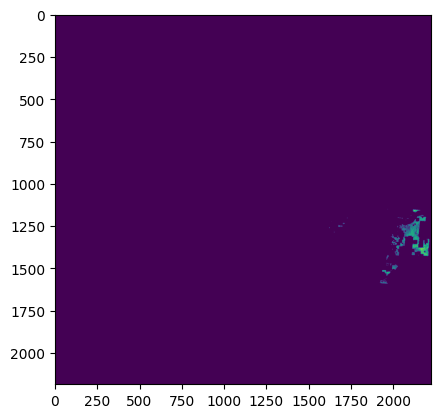

colorado
Wind
dac_farm_env10km
idaho 29864000


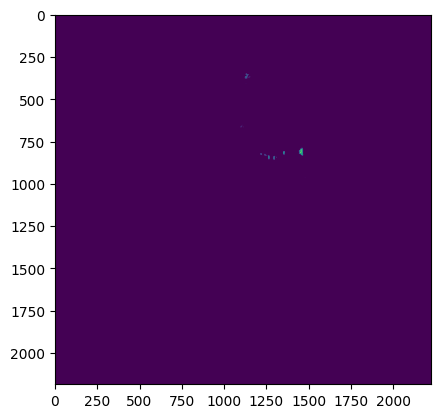

idaho
Wind
dac_farm_env10km
montana 286977485


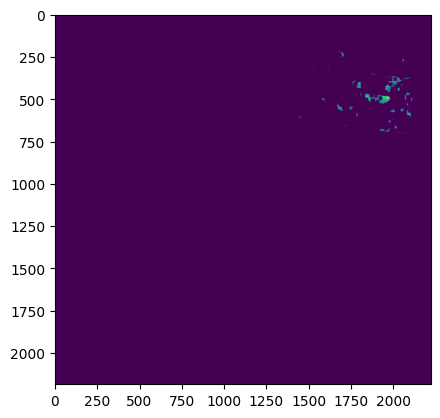

montana
Wind
dac_farm_env10km
new_mexico 218341587


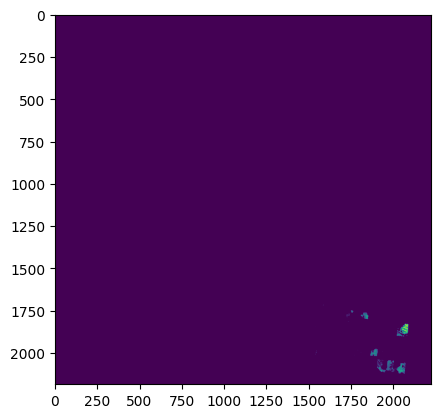

new_mexico
Wind
dac_farm_env10km
nevada 235899804


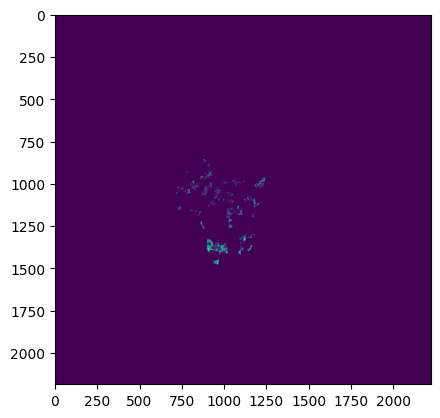

nevada
Wind
dac_farm_env10km
oregon 14480037


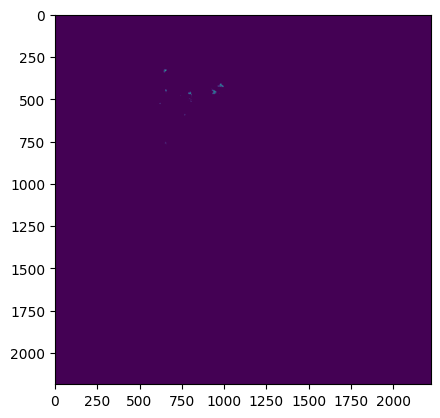

oregon
Wind
dac_farm_env10km
utah 110699178


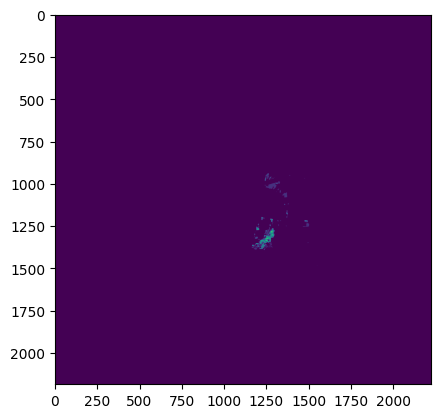

utah
Wind
dac_farm_env10km
washington 34788559


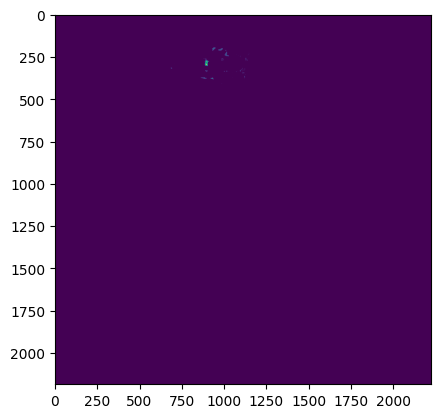

washington
Wind
dac_farm_env10km
wyoming 1008638492


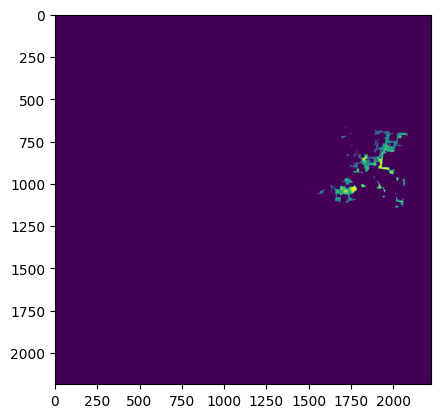

wyoming
Wind
dac_farm_env10km


In [298]:
wind_power_density = 12
hours_per_year = 8760
tech_type = 'Wind'

for analysis_name in exclusion_combos:
    exclusion_list = exclusion_combos[analysis_name]
    print(analysis_name)
    wind_dir = '/Users/mong275/repos/mongird-etal_2024_tbd/data/input_data/raster_data/suitability/wind_onshore/all_areas'

    # create capacity factor array for wind
    cf_list = list(range(5, 51, 5))
    for cf in cf_list:
        wind_raster = rasterio.open(os.path.join(wind_dir, f'gridcerf_wind_onshore_hubheight100_no-cooling_{cf}cf.tif')).read(1)
        if cf_list[0] == cf:
            sum_raster = wind_raster
        else:
            sum_raster = sum_raster + wind_raster

    for i in list(range(sum_raster.min(), sum_raster.max(), 1)):
        assigned_cf = 50 - (i*5)
        print(i, assigned_cf)
        sum_raster = np.where(sum_raster == i, assigned_cf, sum_raster)
    sum_raster = np.where(sum_raster == 10, 0, sum_raster)

    # combine capacity factor with combined exclusion
    if exclusion_list is None:
        final_raster = sum_raster
        
    else:
        # create combined exclusion layer
        for exc in exclusion_list:
            exclusion_array = rasterio.open(exc).read(1)
            exclusion_array = np.where(exclusion_array==1, 1, 0)
            if exclusion_list[0] == exc:
                combined_exclusion = exclusion_array
            else:
                combined_exclusion += exclusion_array
        combined_exclusion = np.where(combined_exclusion >=1, 1, 0)
        combined_exclusion = np.where(combined_exclusion ==1, 0, 1)

        final_raster = sum_raster*combined_exclusion
    
    # open state raster file
    conus_array = rasterio.open(state_raster_path).read(1)
        
    for state in list(output_dict.keys()):
        state_id = state_settings_dict[state]['id_no']
        state_array = np.where(conus_array==state_id, 1, 0)
        state_final_raster = final_raster * state_array

        # calculate total potential generation by state
        state_final_raster = ((state_final_raster/100) * wind_power_density * hours_per_year).astype(int)

        total_generation = state_final_raster.sum()
        print(state, total_generation)
        show(state_final_raster)
        print(state)
        print(tech_type)
        print(analysis_name)
        output_dict[state][tech_type][analysis_name] = total_generation

In [299]:
# convert output dictionary to dataframe
result_df = pd.DataFrame.from_dict({(i,j): output_dict[i][j] 
                           for i in output_dict.keys() 
                           for j in output_dict[i].keys()},
                       orient='index')

result_df = result_df.reset_index().rename(columns={'level_0':'region_name', 'level_1':'tech_name_simple'})
result_df

,region_name,tech_name_simple,baseline,dac,farmland,env_1km,env_5km,env_10km,dac_farm_env5km,dac_farm_env10km
0,arizona,Wind,865362517,330929749,1185806548,1088089583,744062111,455900438,190015028,110798902
1,arizona,Solar PV,[],[],[],[],[],[],[],[]
2,california,Wind,350745758,282808979,587181988,495035803,196958715,66581056,96025109,37479627
3,california,Solar PV,[],[],[],[],[],[],[],[]
4,colorado,Wind,1338130343,1124424458,2252224461,2303164335,1740934616,1123939151,727198917,479488591
5,colorado,Solar PV,[],[],[],[],[],[],[],[]
6,idaho,Wind,469110867,202996902,662631516,584450782,307220353,102893837,89517983,29864000
7,idaho,Solar PV,[],[],[],[],[],[],[],[]
8,montana,Wind,2801800144,2837676836,4808716882,4820926195,2141363507,674558214,976321937,286977485
9,montana,Solar PV,[],[],[],[],[],[],[],[]


In [300]:
output_df = pd.merge(result_df, combo_df_final, how='left', on=['region_name', 'tech_name_simple'])
output_df

,region_name,tech_name_simple,baseline,dac,farmland,env_1km,env_5km,env_10km,dac_farm_env5km,dac_farm_env10km,clean_grid_mwh
0,arizona,Wind,865362517,330929749,1185806548,1088089583,744062111,455900438,190015028,110798902,27293103
1,arizona,Solar PV,[],[],[],[],[],[],[],[],48044337
2,california,Wind,350745758,282808979,587181988,495035803,196958715,66581056,96025109,37479627,154566960
3,california,Solar PV,[],[],[],[],[],[],[],[],114453437
4,colorado,Wind,1338130343,1124424458,2252224461,2303164335,1740934616,1123939151,727198917,479488591,69555893
5,colorado,Solar PV,[],[],[],[],[],[],[],[],48619353
6,idaho,Wind,469110867,202996902,662631516,584450782,307220353,102893837,89517983,29864000,12397083
7,idaho,Solar PV,[],[],[],[],[],[],[],[],1881205
8,montana,Wind,2801800144,2837676836,4808716882,4820926195,2141363507,674558214,976321937,286977485,128392581
9,montana,Solar PV,[],[],[],[],[],[],[],[],16472904


In [301]:
test = output_df.copy()
test = test[test.tech_name_simple == 'Wind']
for col in test.columns[2:-1]:
    test[col] = test[col] - test['clean_grid_mwh']
test

,region_name,tech_name_simple,baseline,dac,farmland,env_1km,env_5km,env_10km,dac_farm_env5km,dac_farm_env10km,clean_grid_mwh
0,arizona,Wind,838069414,303636646,1158513445,1060796480,716769008,428607335,162721925,83505799,27293103
2,california,Wind,196178798,128242019,432615028,340468843,42391755,-87985904,-58541851,-117087333,154566960
4,colorado,Wind,1268574450,1054868565,2182668568,2233608442,1671378723,1054383258,657643024,409932698,69555893
6,idaho,Wind,456713784,190599819,650234433,572053699,294823270,90496754,77120900,17466917,12397083
8,montana,Wind,2673407563,2709284255,4680324301,4692533614,2012970926,546165633,847929356,158584904,128392581
10,new_mexico,Wind,3588801294,354506339,3495957254,3776894748,3017059008,2203380812,221591102,171481624,46859963
12,nevada,Wind,200658794,694706994,904799850,806635545,524568189,297871816,401465417,226297553,9602251
14,oregon,Wind,600502487,193919693,444844842,686856662,352462576,131384852,8450382,-18717330,33197367
16,utah,Wind,167258376,341212334,511318740,455222685,239394938,111167316,149661442,78407602,32291576
18,washington,Wind,331444288,373401804,393447092,657093050,369670362,156392325,61843756,4029371,30759188


## Functions

In [3]:
def calculate_wind_land_area(exclusion_list, output_dict, tech_type, analysis_name='dac', show_array=True):
    """
    For a given list of raster data, this function combines each of the layers with the assumed baseline 
    suitability raster for the technology indicated (wind or solar). From the composite siting suitability
    layer, a conus state raster is used to subselect areas within each individual state and summing the
    total amount of composite land (km^2) that is available for siting that technology.

    :param exclusion_list:           list of paths to raster data to include in the composite suitability
    :type exclusion_list:            list

    :param output_dict:              prepared dictionary where output should be stored for each state
    :type output_dict:               dict

    :param tech_type:                type of technology being evaluated, solar or wind
    :type tech_type:                 str

    :param analysis_name:            name of specific analysis corresponding to prepared output dictionary
    :type analysis_name:             str

    :param show_array:               if true, will plot the composite siting suitability for the given state
    :type show_array:                bool
    
    
    """
    # open state raster file
    conus_array = rasterio.open(state_raster_path).read(1)
    
    for state in list(output_dict.keys()):
        state_id = state_settings_dict[state]['id_no']
        capacity_factor = state_settings_dict[state][tech_type]

        if tech_type == 'Solar PV':
            suit_file_path = os.path.join(suit_dir, f'gridcerf_solar_pv_centralized_no-cooling_{capacity_factor}cf.tif')
        elif tech_type == 'Wind':
            suit_file_path = os.path.join(suit_dir, f'gridcerf_wind_onshore_hubheight100_no-cooling_{capacity_factor}cf.tif')
        else:
            print('tech_type not supported')
    
        # open suitability file
        suit_array = rasterio.open(suit_file_path).read(1)
        suit_array = np.where(suit_array==1, 1, 0)

        # iterate through raster data in exclusion list and apply to baseline suitability
        for exc in exclusion_list:
            exclusion_array = rasterio.open(exc).read(1)
            exclusion_array = np.where(exclusion_array==1, 1, 0)
    
            suit_array += exclusion_array
            suit_array = np.where(suit_array >= 1, 1, 0)
    
        # invert suitability
        suit_array = np.where(suit_array==1, 0, 1)
    
        # select state area from conus raster
        state_array = np.where(conus_array==state_id, 1, 0)
        
        # calculate state suitability
        suit_array *= state_array
    
        # get sum of available area
        total_area_km = suit_array.sum()
    
        # add available area to output dictionary
        output_dict[state][tech_type][analysis_name] = total_area_km
    
        print(f'{tech_type} suitability under {analysis_name} exclusions within {state} is {total_area_km} square km')

        if show_array:
            show(suit_array)
        else:
            pass
    return None

## Settings

In [98]:
# dictionary of wind capacity factor assumped, solar capacity factor assumed, and id number for each state

state_settings_dict={
    'arizona': {'Wind': 25,'Solar PV': 18, 'id_no': 4},
    'california': {'Wind': 20,'Solar PV': 16, 'id_no': 6},
    'colorado':{'Wind': 30,'Solar PV': 18, 'id_no': 8},
    'idaho':{'Wind': 25,'Solar PV': 14, 'id_no': 16},
    'montana':{'Wind': 30,'Solar PV': 14, 'id_no': 30},
    'new_mexico':{'Wind': 30,'Solar PV': 18, 'id_no': 35},
    'nevada':{'Wind': 25,'Solar PV': 18, 'id_no': 32},
    'oregon':{'Wind': 25, 'Solar PV': 14, 'id_no':41},
    'utah':{'Wind': 25,'Solar PV': 16, 'id_no': 49},
    'washington':{'Wind': 25, 'Solar PV': 12, 'id_no': 53},
    'wyoming':{'Wind': 30,'Solar PV': 14, 'id_no': 56}}


In [176]:
# prepare output dictionary to store analysis values
output_dict={
    'arizona': {},
    'california': {},
    'colorado':{},
    'idaho':{},
    'montana':{},
    'new_mexico':{},
    'nevada':{},
    'oregon':{},
    'utah':{},
    'washington':{},
    'wyoming':{}
}
for state in output_dict:
    output_dict[state].update({'Wind':{}, 'Solar PV': {}})
    
    for i in output_dict[state]:
        output_dict[state][i].update({'baseline':[], 'dac': [], 'farmland':[], 
                                      'env_1km':[], 'env_5km':[], 'env_10km':[], 
                                      'dac_farm_env5km':[], 'farm_env5km':[], 'farm_env10km':[]})

# Wind

## Baseline Siting Availability

How much land is available for siting with no additional restrictions in each state?

Wind suitability under baseline exclusions within arizona is 5477 square km


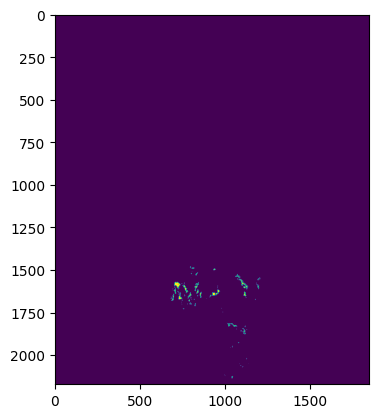

Wind suitability under baseline exclusions within california is 9514 square km


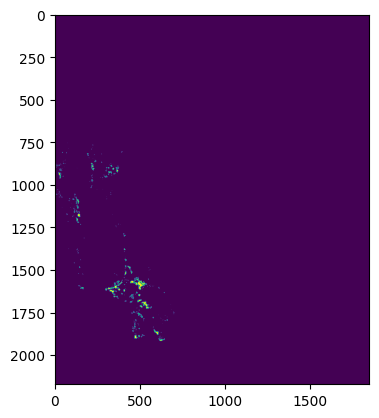

Wind suitability under baseline exclusions within colorado is 34116 square km


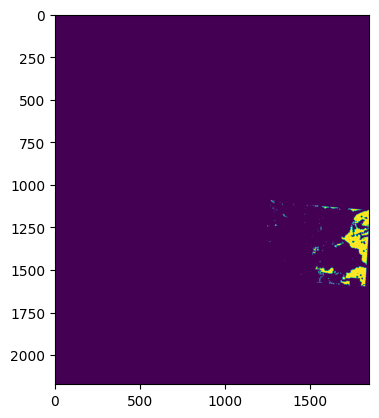

Wind suitability under baseline exclusions within idaho is 3329 square km


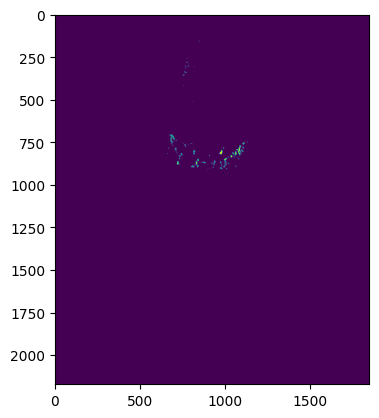

Wind suitability under baseline exclusions within montana is 95935 square km


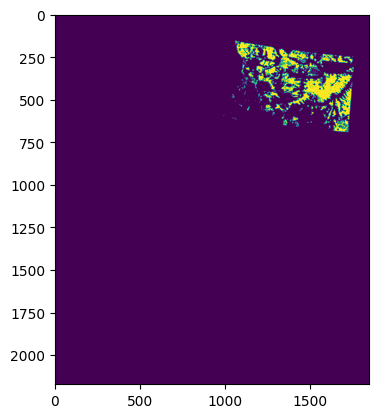

Wind suitability under baseline exclusions within new_mexico is 53510 square km


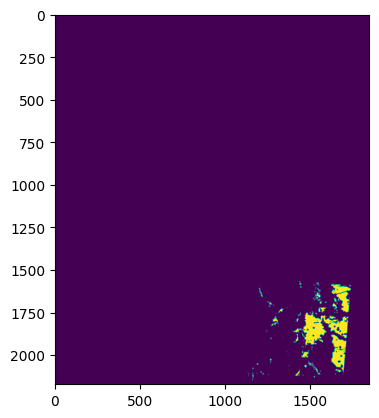

Wind suitability under baseline exclusions within nevada is 5545 square km


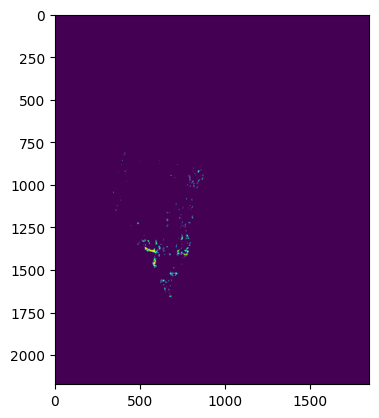

Wind suitability under baseline exclusions within oregon is 6434 square km


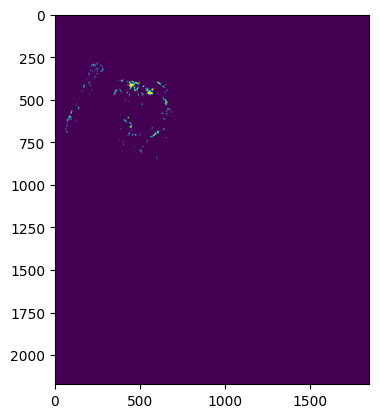

Wind suitability under baseline exclusions within utah is 2860 square km


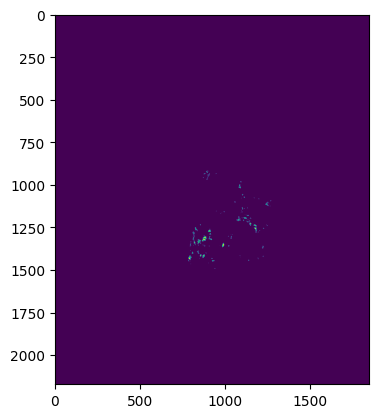

Wind suitability under baseline exclusions within washington is 5392 square km


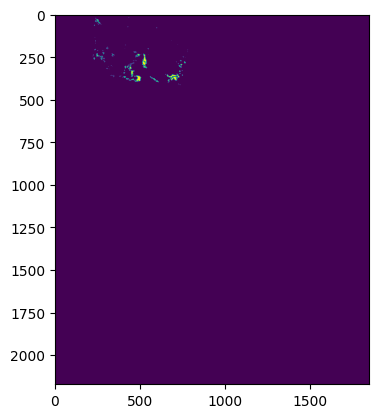

Wind suitability under baseline exclusions within wyoming is 74324 square km


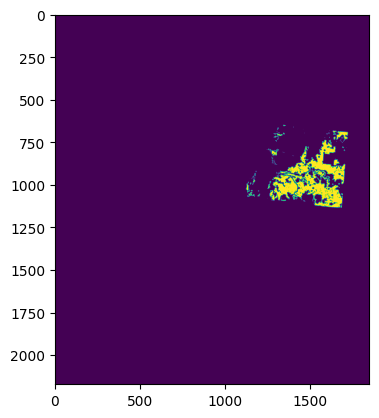

In [6]:
exclusion_list = []
tech_type = 'Wind'
analysis_name = 'baseline'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=True)

## DAC areas excluded

In [7]:
exclusion_list = [dac_raster_path]
tech_type = 'Wind'
analysis_name = 'dac'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Wind suitability under dac exclusions within arizona is 1371 square km
Wind suitability under dac exclusions within california is 4789 square km
Wind suitability under dac exclusions within colorado is 14401 square km
Wind suitability under dac exclusions within idaho is 1075 square km
Wind suitability under dac exclusions within montana is 46731 square km
Wind suitability under dac exclusions within new_mexico is 4687 square km
Wind suitability under dac exclusions within nevada is 4545 square km
Wind suitability under dac exclusions within oregon is 2122 square km
Wind suitability under dac exclusions within utah is 2048 square km
Wind suitability under dac exclusions within washington is 3102 square km
Wind suitability under dac exclusions within wyoming is 62770 square km


## Important farmland areas excluded

In [8]:
exclusion_list = [farm_raster_path]
tech_type = 'Wind'
analysis_name = 'farmland'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Wind suitability under farmland exclusions within arizona is 5477 square km
Wind suitability under farmland exclusions within california is 9129 square km
Wind suitability under farmland exclusions within colorado is 30713 square km
Wind suitability under farmland exclusions within idaho is 3309 square km
Wind suitability under farmland exclusions within montana is 81764 square km
Wind suitability under farmland exclusions within new_mexico is 44208 square km
Wind suitability under farmland exclusions within nevada is 5545 square km
Wind suitability under farmland exclusions within oregon is 3766 square km
Wind suitability under farmland exclusions within utah is 2845 square km
Wind suitability under farmland exclusions within washington is 3406 square km
Wind suitability under farmland exclusions within wyoming is 73638 square km


## Areas surrounding natural areas excluded

### Areas within 1-km

In [9]:
exclusion_list = [env_1km_raster_path]
tech_type = 'Wind'
analysis_name = 'env_1km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Wind suitability under env_1km exclusions within arizona is 4759 square km
Wind suitability under env_1km exclusions within california is 7281 square km
Wind suitability under env_1km exclusions within colorado is 33011 square km
Wind suitability under env_1km exclusions within idaho is 2950 square km
Wind suitability under env_1km exclusions within montana is 83647 square km
Wind suitability under env_1km exclusions within new_mexico is 51671 square km
Wind suitability under env_1km exclusions within nevada is 4910 square km
Wind suitability under env_1km exclusions within oregon is 5148 square km
Wind suitability under env_1km exclusions within utah is 2383 square km
Wind suitability under env_1km exclusions within washington is 4851 square km
Wind suitability under env_1km exclusions within wyoming is 67673 square km


### Areas within 5-km

In [10]:
exclusion_list = [env_5km_raster_path]
tech_type = 'Wind'
analysis_name = 'env_5km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Wind suitability under env_5km exclusions within arizona is 3183 square km
Wind suitability under env_5km exclusions within california is 2861 square km
Wind suitability under env_5km exclusions within colorado is 28073 square km
Wind suitability under env_5km exclusions within idaho is 1680 square km
Wind suitability under env_5km exclusions within montana is 41428 square km
Wind suitability under env_5km exclusions within new_mexico is 44550 square km
Wind suitability under env_5km exclusions within nevada is 3411 square km
Wind suitability under env_5km exclusions within oregon is 2507 square km
Wind suitability under env_5km exclusions within utah is 1413 square km
Wind suitability under env_5km exclusions within washington is 2802 square km
Wind suitability under env_5km exclusions within wyoming is 41867 square km


### Areas within 10-km

In [11]:
exclusion_list = [env_10km_raster_path]
tech_type = 'Wind'
analysis_name = 'env_10km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Wind suitability under env_10km exclusions within arizona is 1896 square km
Wind suitability under env_10km exclusions within california is 1047 square km
Wind suitability under env_10km exclusions within colorado is 20096 square km
Wind suitability under env_10km exclusions within idaho is 565 square km
Wind suitability under env_10km exclusions within montana is 14887 square km
Wind suitability under env_10km exclusions within new_mexico is 35648 square km
Wind suitability under env_10km exclusions within nevada is 2095 square km
Wind suitability under env_10km exclusions within oregon is 1090 square km
Wind suitability under env_10km exclusions within utah is 905 square km
Wind suitability under env_10km exclusions within washington is 1530 square km
Wind suitability under env_10km exclusions within wyoming is 20121 square km


## Combinations

#### DACs, Important Farmland, and Areas within 5km of Natural Areas Excluded

In [12]:
exclusion_list = [dac_raster_path, farm_raster_path, env_5km_raster_path]
tech_type = 'Wind'
analysis_name = 'dac_farm_env5km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Wind suitability under dac_farm_env5km exclusions within arizona is 673 square km
Wind suitability under dac_farm_env5km exclusions within california is 1981 square km
Wind suitability under dac_farm_env5km exclusions within colorado is 11617 square km
Wind suitability under dac_farm_env5km exclusions within idaho is 786 square km
Wind suitability under dac_farm_env5km exclusions within montana is 18614 square km
Wind suitability under dac_farm_env5km exclusions within new_mexico is 3098 square km
Wind suitability under dac_farm_env5km exclusions within nevada is 2818 square km
Wind suitability under dac_farm_env5km exclusions within oregon is 363 square km
Wind suitability under dac_farm_env5km exclusions within utah is 1096 square km
Wind suitability under dac_farm_env5km exclusions within washington is 924 square km
Wind suitability under dac_farm_env5km exclusions within wyoming is 35729 square km


#### Important Farmland, and Areas within 5km of Natural Areas Excluded

In [13]:
exclusion_list = [farm_raster_path, env_5km_raster_path]
tech_type = 'Wind'
analysis_name = 'farm_env5km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Wind suitability under farm_env5km exclusions within arizona is 3183 square km
Wind suitability under farm_env5km exclusions within california is 2781 square km
Wind suitability under farm_env5km exclusions within colorado is 25070 square km
Wind suitability under farm_env5km exclusions within idaho is 1666 square km
Wind suitability under farm_env5km exclusions within montana is 35522 square km
Wind suitability under farm_env5km exclusions within new_mexico is 36562 square km
Wind suitability under farm_env5km exclusions within nevada is 3411 square km
Wind suitability under farm_env5km exclusions within oregon is 1379 square km
Wind suitability under farm_env5km exclusions within utah is 1413 square km
Wind suitability under farm_env5km exclusions within washington is 1884 square km
Wind suitability under farm_env5km exclusions within wyoming is 41395 square km


#### Important Farmland, and Areas within 10km of Natural Areas Excluded

In [14]:
exclusion_list = [farm_raster_path, env_10km_raster_path]
tech_type = 'Wind'
analysis_name = 'farm_env10km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Wind suitability under farm_env10km exclusions within arizona is 1896 square km
Wind suitability under farm_env10km exclusions within california is 1029 square km
Wind suitability under farm_env10km exclusions within colorado is 17792 square km
Wind suitability under farm_env10km exclusions within idaho is 556 square km
Wind suitability under farm_env10km exclusions within montana is 12845 square km
Wind suitability under farm_env10km exclusions within new_mexico is 28974 square km
Wind suitability under farm_env10km exclusions within nevada is 2095 square km
Wind suitability under farm_env10km exclusions within oregon is 548 square km
Wind suitability under farm_env10km exclusions within utah is 905 square km
Wind suitability under farm_env10km exclusions within washington is 1023 square km
Wind suitability under farm_env10km exclusions within wyoming is 19900 square km


________

# Solar PV

## Baseline Siting Availability

How much land is available for siting with no additional restrictions in each state?

In [15]:
exclusion_list = []
tech_type = 'Solar PV'
analysis_name = 'baseline'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Solar PV suitability under baseline exclusions within arizona is 149468 square km
Solar PV suitability under baseline exclusions within california is 94422 square km
Solar PV suitability under baseline exclusions within colorado is 118782 square km
Solar PV suitability under baseline exclusions within idaho is 64018 square km
Solar PV suitability under baseline exclusions within montana is 200614 square km
Solar PV suitability under baseline exclusions within new_mexico is 201750 square km
Solar PV suitability under baseline exclusions within nevada is 106346 square km
Solar PV suitability under baseline exclusions within oregon is 60930 square km
Solar PV suitability under baseline exclusions within utah is 61940 square km
Solar PV suitability under baseline exclusions within washington is 60247 square km
Solar PV suitability under baseline exclusions within wyoming is 150777 square km


## DAC areas excluded

In [16]:
exclusion_list = [dac_raster_path]
tech_type = 'Solar PV'
analysis_name = 'dac'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Solar PV suitability under dac exclusions within arizona is 46395 square km
Solar PV suitability under dac exclusions within california is 38251 square km
Solar PV suitability under dac exclusions within colorado is 58883 square km
Solar PV suitability under dac exclusions within idaho is 18522 square km
Solar PV suitability under dac exclusions within montana is 104611 square km
Solar PV suitability under dac exclusions within new_mexico is 23030 square km
Solar PV suitability under dac exclusions within nevada is 81135 square km
Solar PV suitability under dac exclusions within oregon is 11622 square km
Solar PV suitability under dac exclusions within utah is 34126 square km
Solar PV suitability under dac exclusions within washington is 32459 square km
Solar PV suitability under dac exclusions within wyoming is 127750 square km


## Important farmland areas excluded

In [17]:
exclusion_list = [farm_raster_path]
tech_type = 'Solar PV'
analysis_name = 'farmland'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Solar PV suitability under farmland exclusions within arizona is 146345 square km
Solar PV suitability under farmland exclusions within california is 78597 square km
Solar PV suitability under farmland exclusions within colorado is 108230 square km
Solar PV suitability under farmland exclusions within idaho is 62934 square km
Solar PV suitability under farmland exclusions within montana is 168821 square km
Solar PV suitability under farmland exclusions within new_mexico is 179489 square km
Solar PV suitability under farmland exclusions within nevada is 106295 square km
Solar PV suitability under farmland exclusions within oregon is 28275 square km
Solar PV suitability under farmland exclusions within utah is 57113 square km
Solar PV suitability under farmland exclusions within washington is 32568 square km
Solar PV suitability under farmland exclusions within wyoming is 149870 square km


## Areas surrounding natural areas excluded

### Areas within 1-km

In [18]:
exclusion_list = [env_1km_raster_path]
tech_type = 'Solar PV'
analysis_name = 'env_1km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Solar PV suitability under env_1km exclusions within arizona is 138003 square km
Solar PV suitability under env_1km exclusions within california is 77444 square km
Solar PV suitability under env_1km exclusions within colorado is 108317 square km
Solar PV suitability under env_1km exclusions within idaho is 54342 square km
Solar PV suitability under env_1km exclusions within montana is 169865 square km
Solar PV suitability under env_1km exclusions within new_mexico is 188217 square km
Solar PV suitability under env_1km exclusions within nevada is 95328 square km
Solar PV suitability under env_1km exclusions within oregon is 50877 square km
Solar PV suitability under env_1km exclusions within utah is 55520 square km
Solar PV suitability under env_1km exclusions within washington is 52188 square km
Solar PV suitability under env_1km exclusions within wyoming is 134216 square km


### Areas within 5-km

In [19]:
exclusion_list = [env_5km_raster_path]
tech_type = 'Solar PV'
analysis_name = 'env_5km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Solar PV suitability under env_5km exclusions within arizona is 96083 square km
Solar PV suitability under env_5km exclusions within california is 35956 square km
Solar PV suitability under env_5km exclusions within colorado is 74108 square km
Solar PV suitability under env_5km exclusions within idaho is 24823 square km
Solar PV suitability under env_5km exclusions within montana is 73973 square km
Solar PV suitability under env_5km exclusions within new_mexico is 140879 square km
Solar PV suitability under env_5km exclusions within nevada is 58064 square km
Solar PV suitability under env_5km exclusions within oregon is 24900 square km
Solar PV suitability under env_5km exclusions within utah is 35567 square km
Solar PV suitability under env_5km exclusions within washington is 27573 square km
Solar PV suitability under env_5km exclusions within wyoming is 77349 square km


### Areas within 10-km

In [20]:
exclusion_list = [env_10km_raster_path]
tech_type = 'Solar PV'
analysis_name = 'env_10km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Solar PV suitability under env_10km exclusions within arizona is 58685 square km
Solar PV suitability under env_10km exclusions within california is 12363 square km
Solar PV suitability under env_10km exclusions within colorado is 44812 square km
Solar PV suitability under env_10km exclusions within idaho is 7220 square km
Solar PV suitability under env_10km exclusions within montana is 22620 square km
Solar PV suitability under env_10km exclusions within new_mexico is 95623 square km
Solar PV suitability under env_10km exclusions within nevada is 31555 square km
Solar PV suitability under env_10km exclusions within oregon is 9672 square km
Solar PV suitability under env_10km exclusions within utah is 20191 square km
Solar PV suitability under env_10km exclusions within washington is 11489 square km
Solar PV suitability under env_10km exclusions within wyoming is 35279 square km


## Combinations

#### DACs, Important Farmland, and Areas within 5km of Natural Areas Excluded

In [21]:
exclusion_list = [dac_raster_path, farm_raster_path, env_5km_raster_path]
tech_type = 'Solar PV'
analysis_name = 'dac_farm_env5km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Solar PV suitability under dac_farm_env5km exclusions within arizona is 29037 square km
Solar PV suitability under dac_farm_env5km exclusions within california is 11447 square km
Solar PV suitability under dac_farm_env5km exclusions within colorado is 33028 square km
Solar PV suitability under dac_farm_env5km exclusions within idaho is 5924 square km
Solar PV suitability under dac_farm_env5km exclusions within montana is 34122 square km
Solar PV suitability under dac_farm_env5km exclusions within new_mexico is 13895 square km
Solar PV suitability under dac_farm_env5km exclusions within nevada is 43722 square km
Solar PV suitability under dac_farm_env5km exclusions within oregon is 1582 square km
Solar PV suitability under dac_farm_env5km exclusions within utah is 19698 square km
Solar PV suitability under dac_farm_env5km exclusions within washington is 5980 square km
Solar PV suitability under dac_farm_env5km exclusions within wyoming is 66940 square km


#### Important Farmland, and Areas within 5km of Natural Areas Excluded

In [22]:
exclusion_list = [farm_raster_path, env_5km_raster_path]
tech_type = 'Solar PV'
analysis_name = 'farm_env5km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Solar PV suitability under farm_env5km exclusions within arizona is 94923 square km
Solar PV suitability under farm_env5km exclusions within california is 28055 square km
Solar PV suitability under farm_env5km exclusions within colorado is 67459 square km
Solar PV suitability under farm_env5km exclusions within idaho is 24319 square km
Solar PV suitability under farm_env5km exclusions within montana is 63629 square km
Solar PV suitability under farm_env5km exclusions within new_mexico is 123471 square km
Solar PV suitability under farm_env5km exclusions within nevada is 58022 square km
Solar PV suitability under farm_env5km exclusions within oregon is 10776 square km
Solar PV suitability under farm_env5km exclusions within utah is 33048 square km
Solar PV suitability under farm_env5km exclusions within washington is 14369 square km
Solar PV suitability under farm_env5km exclusions within wyoming is 76781 square km


#### Important Farmland, and Areas within 10km of Natural Areas Excluded

In [23]:
exclusion_list = [farm_raster_path, env_10km_raster_path]
tech_type = 'Solar PV'
analysis_name = 'farm_env10km'

calculate_wind_land_area(exclusion_list=exclusion_list, output_dict=output_dict, 
                         tech_type=tech_type, analysis_name=analysis_name, show_array=False)

Solar PV suitability under farm_env10km exclusions within arizona is 58270 square km
Solar PV suitability under farm_env10km exclusions within california is 9345 square km
Solar PV suitability under farm_env10km exclusions within colorado is 40765 square km
Solar PV suitability under farm_env10km exclusions within idaho is 6999 square km
Solar PV suitability under farm_env10km exclusions within montana is 19598 square km
Solar PV suitability under farm_env10km exclusions within new_mexico is 82948 square km
Solar PV suitability under farm_env10km exclusions within nevada is 31536 square km
Solar PV suitability under farm_env10km exclusions within oregon is 4147 square km
Solar PV suitability under farm_env10km exclusions within utah is 19213 square km
Solar PV suitability under farm_env10km exclusions within washington is 6037 square km
Solar PV suitability under farm_env10km exclusions within wyoming is 35039 square km


___________

## Prepare Output

In [24]:
# convert output dictionary to dataframe
df = pd.DataFrame.from_dict({(i,j): output_dict[i][j] 
                           for i in output_dict.keys() 
                           for j in output_dict[i].keys()},
                       orient='index')

df = df.reset_index().rename(columns={'level_0':'region_name', 'level_1':'tech_name_simple'})

,region_name,tech_name_simple,baseline,dac,farmland,env_1km,env_5km,env_10km,dac_farm_env5km,farm_env5km,farm_env10km
0,arizona,Wind,5477,1371,5477,4759,3183,1896,673,3183,1896
1,arizona,Solar PV,149468,46395,146345,138003,96083,58685,29037,94923,58270
2,california,Wind,9514,4789,9129,7281,2861,1047,1981,2781,1029
3,california,Solar PV,94422,38251,78597,77444,35956,12363,11447,28055,9345
4,colorado,Wind,34116,14401,30713,33011,28073,20096,11617,25070,17792
5,colorado,Solar PV,118782,58883,108230,108317,74108,44812,33028,67459,40765
6,idaho,Wind,3329,1075,3309,2950,1680,565,786,1666,556
7,idaho,Solar PV,64018,18522,62934,54342,24823,7220,5924,24319,6999
8,montana,Wind,95935,46731,81764,83647,41428,14887,18614,35522,12845
9,montana,Solar PV,200614,104611,168821,169865,73973,22620,34122,63629,19598


### Collect land actually used by wind and solar in each experiment scenario

In [25]:
# collect infrastructure data
sitings_df = pd.read_csv(infrastucture_path)

# select new infrastructure sitings only
sitings_df = sitings_df[sitings_df.cerf_sited == 1]

# reduce to year of interest
sitings_df = sitings_df[sitings_df.sited_year <= year]

# select wind and solar only
sitings_df = sitings_df[sitings_df.tech_name_simple.isin(['Solar PV', 'Wind'])]

# collect the total land usage used by solar and wind by state and scenario
sitings_df = sitings_df[['scenario', 'region_name', 'tech_name_simple', 'xcoord']].groupby(['scenario', 'region_name', 'tech_name_simple'], 
                                                                                           as_index=False).count()
# shorten scenario names
sitings_df.scenario.replace('business_as_usual_ira_ccs_climate', 'bau_km', inplace=True)
sitings_df.scenario.replace('net_zero_ira_ccs_climate', 'clean_grid_km', inplace=True)

#Pivoting dataframe
sitings_df = pd.pivot_table(sitings_df, values='xcoord', index=['region_name', 'tech_name_simple'], columns=['scenario'], aggfunc=np.sum)
sitings_df = sitings_df.reset_index()
sitings_df = sitings_df.rename_axis(None, axis=1)

,region_name,tech_name_simple,bau_km,clean_grid_km
0,arizona,Solar PV,725,914
1,arizona,Wind,614,715
2,california,Solar PV,1398,2264
3,california,Wind,2025,3066
4,colorado,Solar PV,661,925
5,colorado,Wind,1095,1596
6,idaho,Solar PV,32,42
7,idaho,Wind,302,336
8,montana,Solar PV,221,388
9,montana,Wind,2141,2921


##### Combine dataframes and save to file

In [26]:
output_df = pd.merge(df, sitings_df, how='left', on=['region_name', 'tech_name_simple'])

In [28]:
# output file path
output_path = os.path.join(output_dir, f'suitability_analysis_{year}.csv')

output_df.to_csv(output_path, index=False)